In [1]:
import os
import numpy as np
import torch
import torch.utils.data

from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
from torchvision import transforms, io
from torchvision.utils import save_image
from tqdm import tqdm
from torch.utils.data import DataLoader, Dataset, random_split
import glob


In [2]:
torch.cuda.is_available()

False

In [3]:
annos = (glob.glob("2008/*.txt"))
annos = sorted(annos)
imgs = (glob.glob("2008/*.jpg"))
imgs = sorted(imgs)
print(len(imgs))

671


In [4]:
img_pth = '2008/mcr_lter4_fringingreef_pole2-3_qu7_20080503.jpg'
anno_pth = '2008/mcr_lter4_fringingreef_pole2-3_qu7_20080503.jpg.txt'

In [5]:
image = Image.open(img_pth)

In [6]:
labels = pd.read_csv(anno_pth,sep = ' *; *', names = ["Row", "Col", 'Label'], header=0)


<ipython-input-6-0d8ffc85bc1f>:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  labels = pd.read_csv(anno_pth,sep = ' *; *', names = ["Row", "Col", 'Label'], header=0)


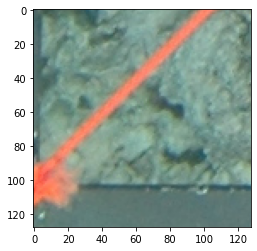

Sand
1757 169


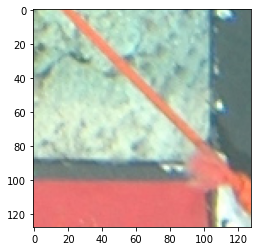

Sand
1792 1733


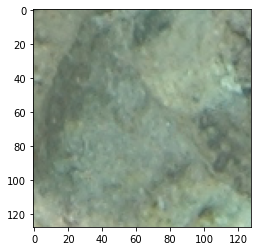

Sand
1719 1110


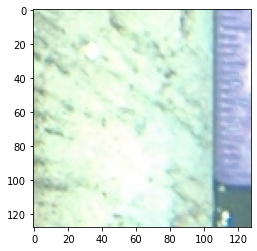

CCA
1549 1731


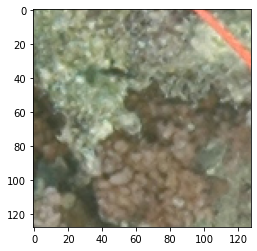

Monti
861 741


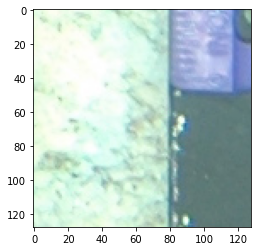

CCA
1605 1757


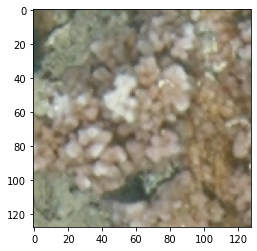

Monti
476 644


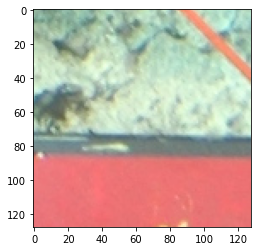

Sand
1806 1677


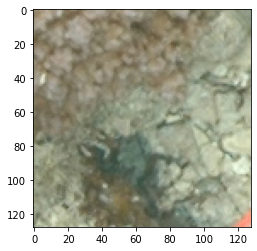

Monti
1061 728


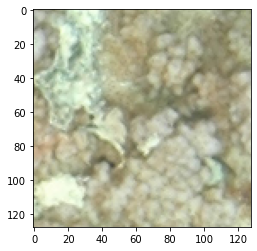

Monti
818 1387


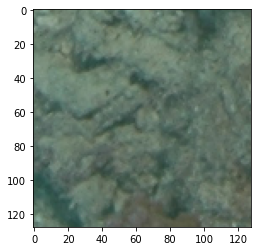

Sand
1606 572


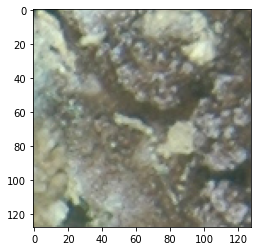

Monti
554 1586


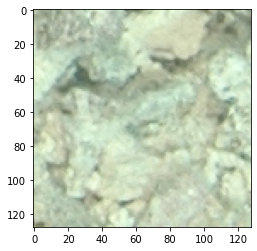

Sand
1243 1384


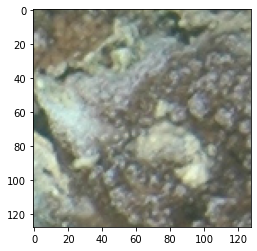

Monti
482 1590


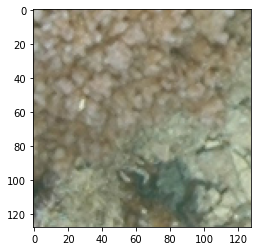

Monti
1046 705


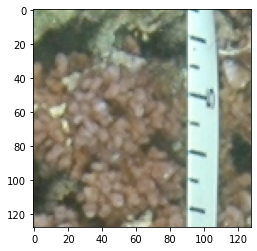

Monti
510 948


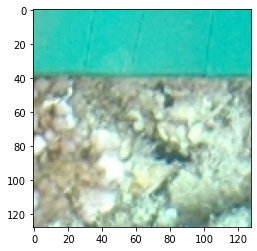

Turf
175 1231


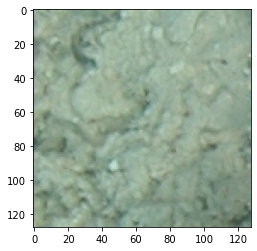

Sand
644 239


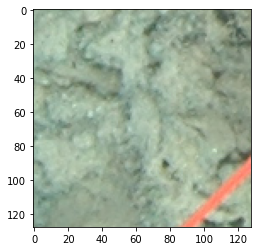

Sand
1335 480


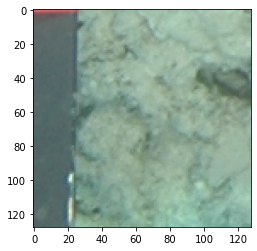

Sand
1362 154


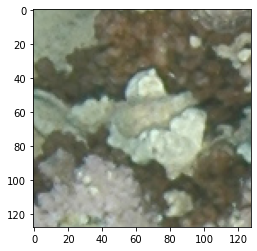

CCA
695 501


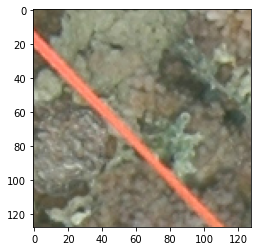

Monti
599 599


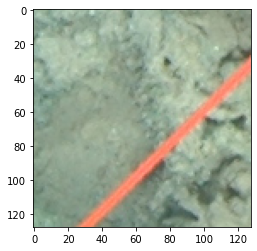

Turf
1395 479


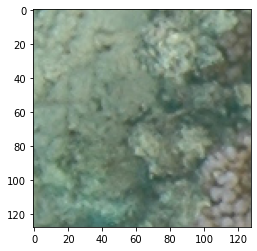

Turf
702 301


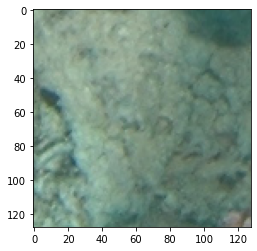

Sand
1729 355


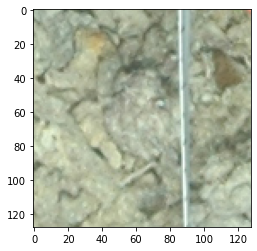

CCA
1112 954


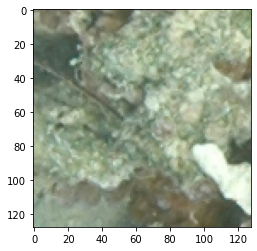

Turf
969 549


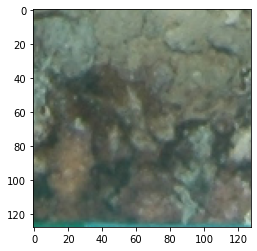

Monti
1739 796


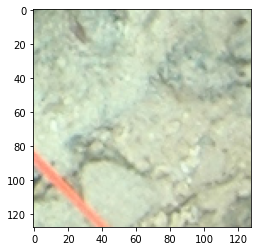

Sand
1456 1507


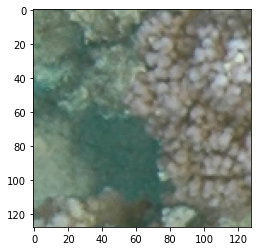

Monti
781 339


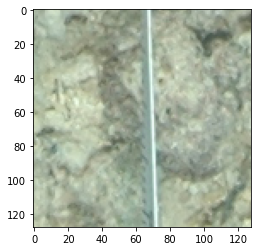

CCA
1424 981


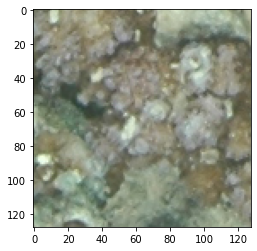

Monti
1387 671


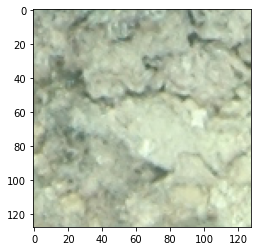

CCA
1462 1106


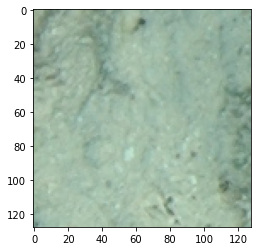

Sand
1111 236


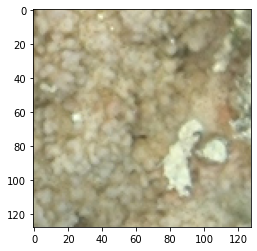

Monti
965 1191


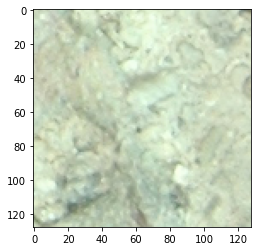

CCA
1346 1471


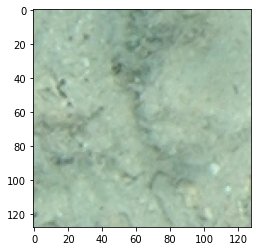

Sand
1180 299


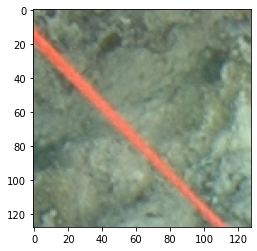

Sand
301 306


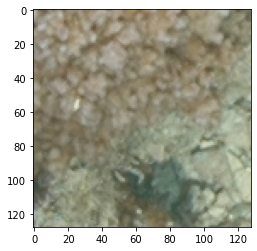

Monti
1046 708


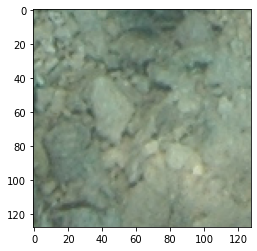

CCA
1627 780


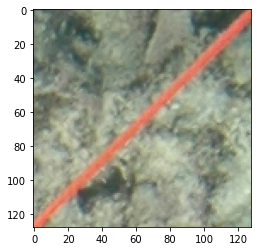

Turf
317 1605


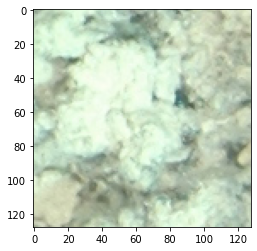

CCA
1144 1459


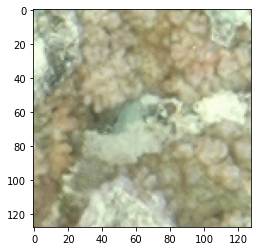

Monti
867 1292


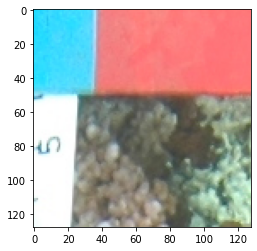

Monti
161 1005


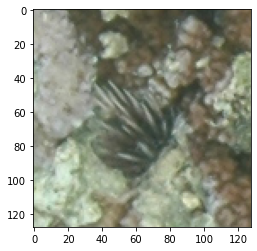

CCA
788 539


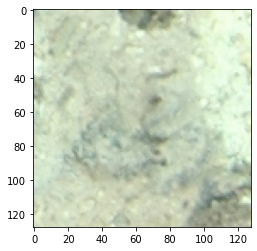

Sand
1410 1557


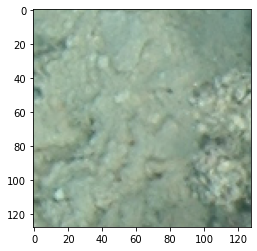

Sand
627 271


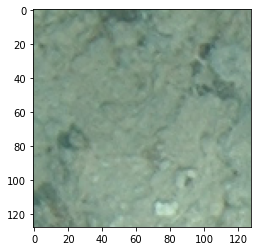

Sand
491 228


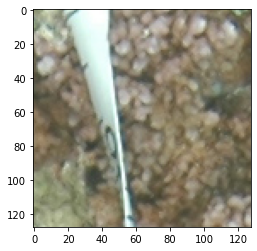

Monti
304 982


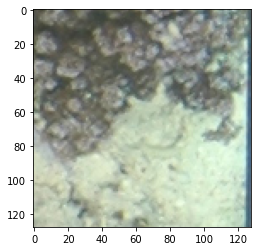

CCA
668 1718


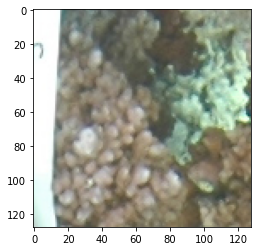

Monti
216 1015


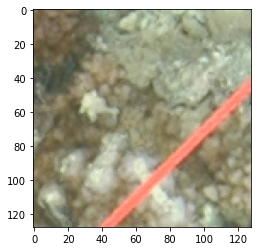

Monti
600 1275


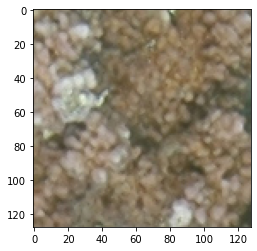

Monti
471 796


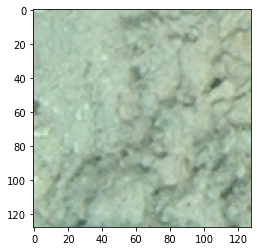

Sand
1239 435


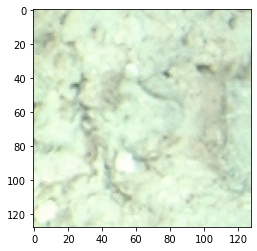

Sand
1135 1680


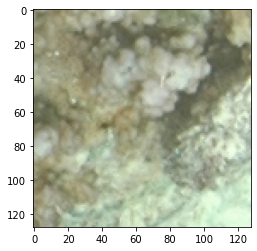

Monti
1056 1337


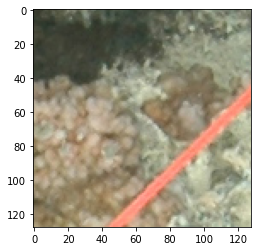

Monti
737 1131


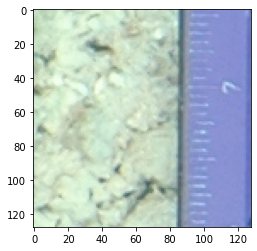

Sand
1008 1755


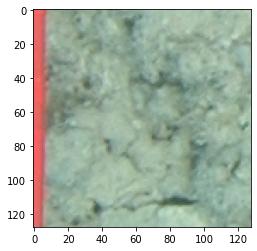

Sand
1233 175


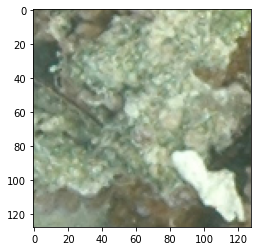

CCA
965 561


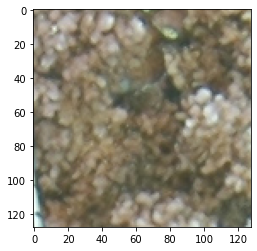

Monti
306 1036


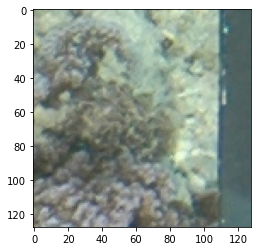

Monti
469 1737


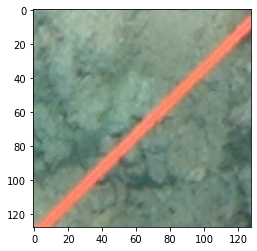

Sand
1476 422


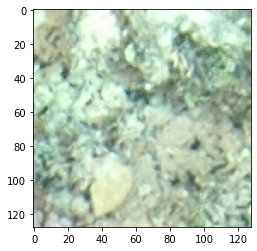

Macro
398 1293


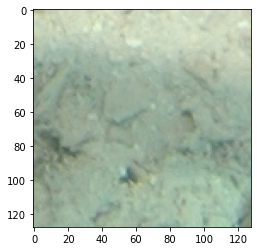

Sand
1679 1460


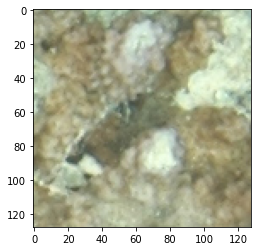

Monti
690 1432


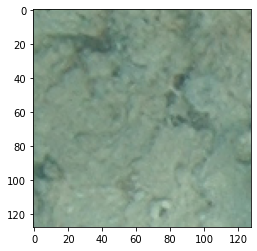

Sand
473 243


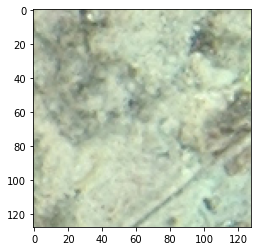

Turf
837 1688


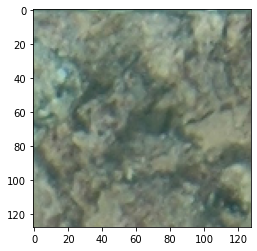

Turf
216 1518


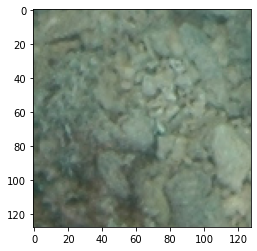

Sand
1599 709


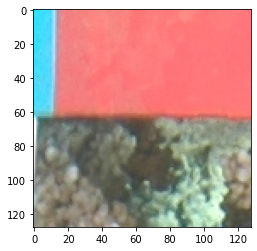

Monti
148 1029


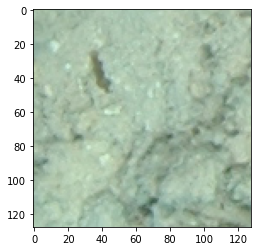

Sand
1252 393


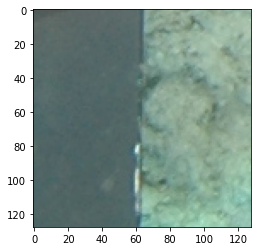

Sand
1379 115


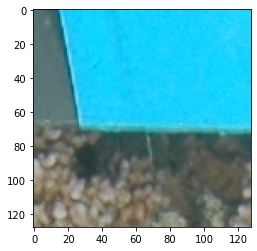

Monti
136 814


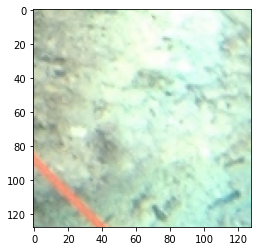

CCA
1653 1702


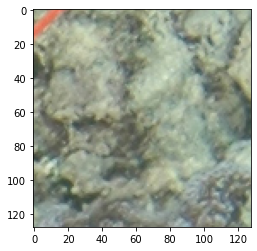

Turf
384 1653


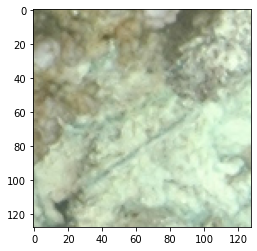

CCA
1108 1336


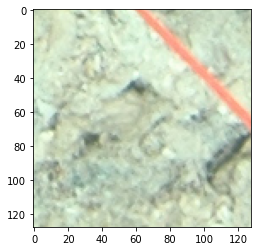

CCA
1481 1384


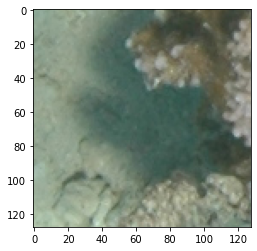

Sand
1099 545


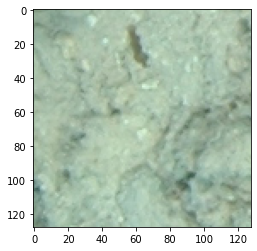

Sand
1267 371


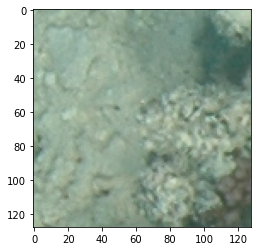

Turf
617 302


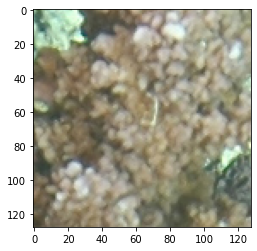

Monti
263 1112


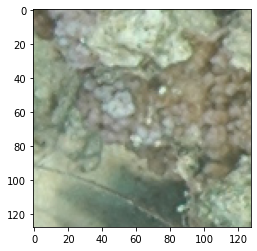

Monti
883 486


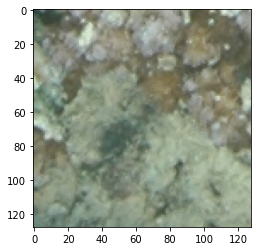

Sand
1442 696


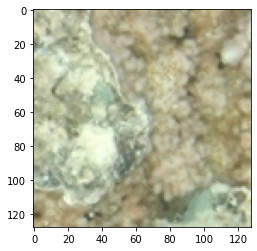

CCA
815 1251


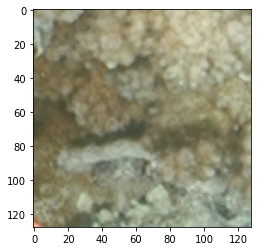

Monti
1088 1188


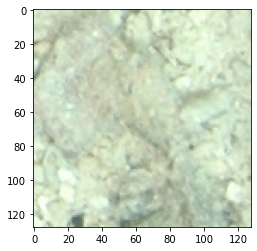

CCA
1336 1440


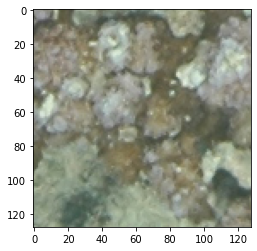

Monti
1400 719


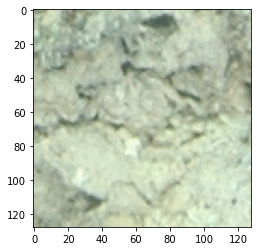

CCA
1445 1145


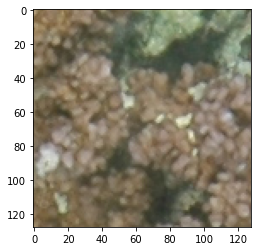

Monti
504 874


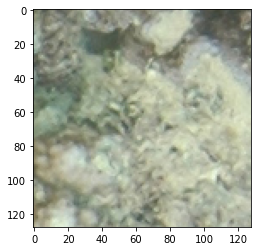

Turf
699 1590


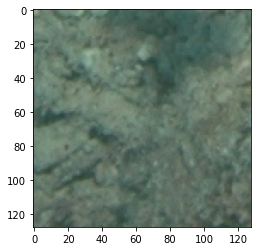

Sand
1574 596


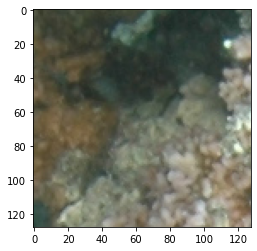

CCA
372 637


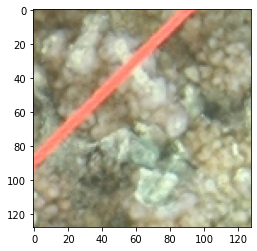

Monti
670 1286


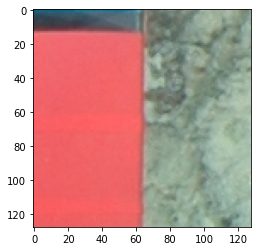

Sand
1116 118


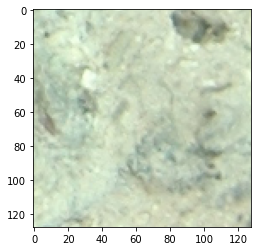

Sand
1402 1525


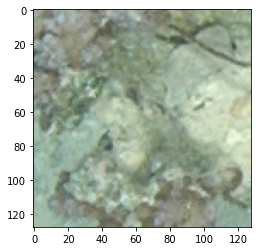

CCA
942 320


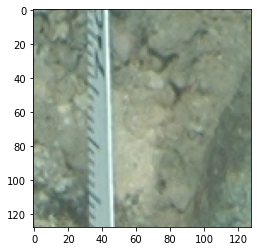

Sand
1689 1015


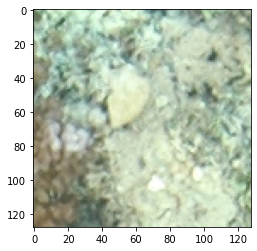

CCA
450 1283


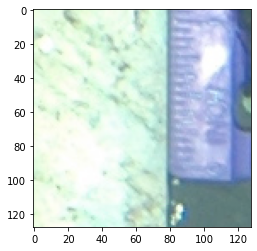

CCA
1553 1758


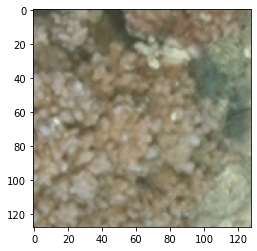

Monti
970 725


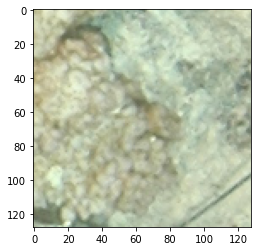

Monti
955 1508


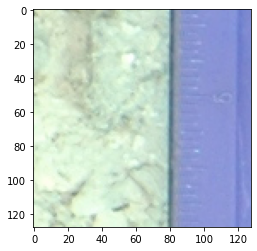

Sand
1171 1759


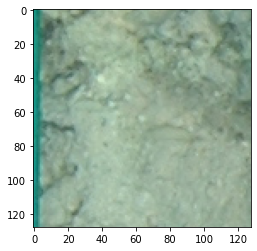

Sand
775 183


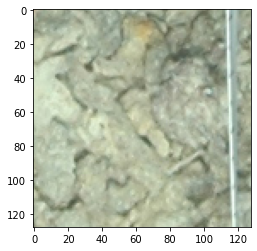

CCA
1119 926


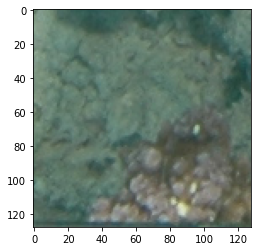

Sand
1737 432


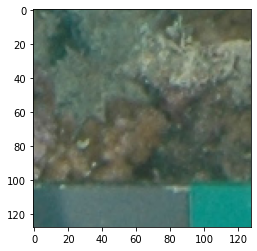

Monti
1762 535


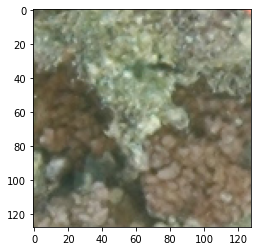

Turf
864 713


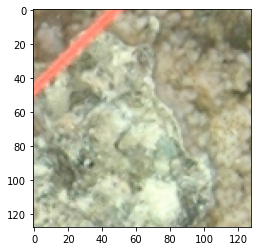

CCA
783 1214


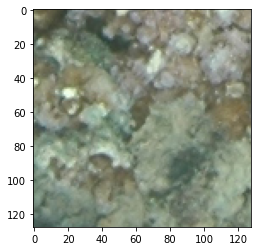

CCA
1426 656


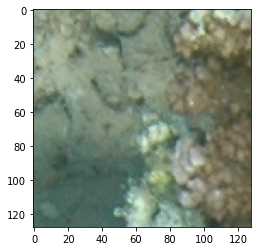

CCA
308 493


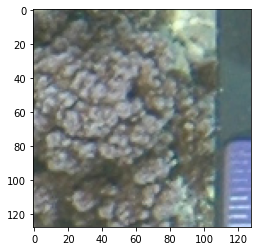

Monti
546 1738


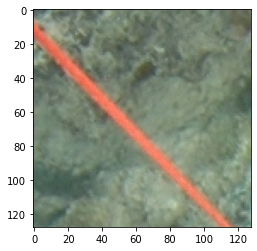

Sand
284 286


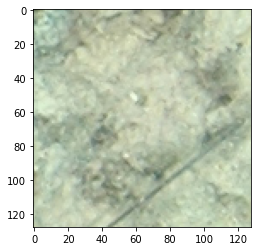

Sand
923 1593


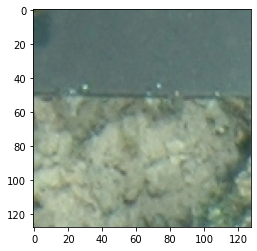

Sand
149 494


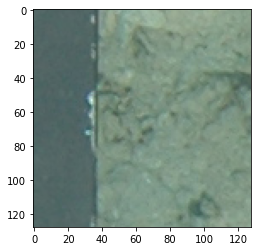

Sand
451 151


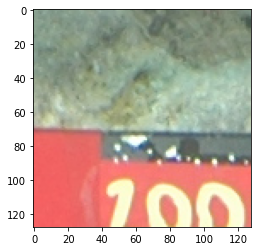

Gardin
1799 1148


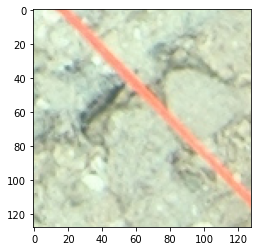

Sand
1510 1458


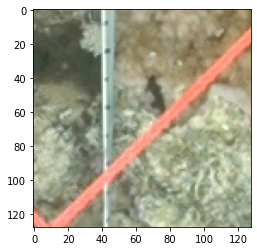

Macro
902 998


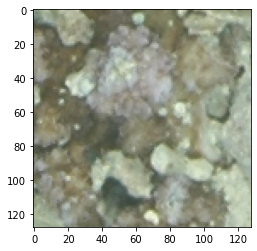

Monti
1395 784


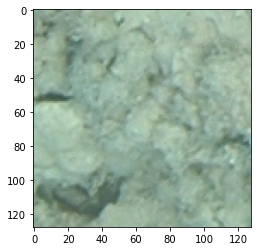

Turf
1294 248


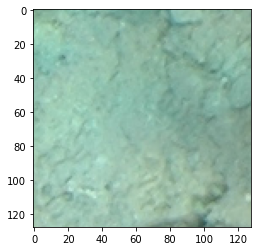

Sand
1491 212


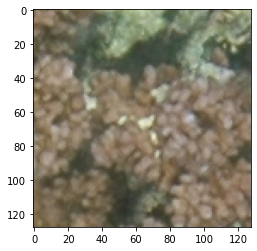

Monti
503 896


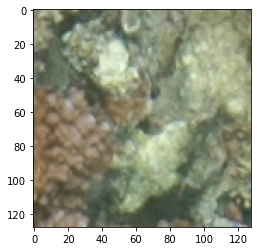

Monti
412 888


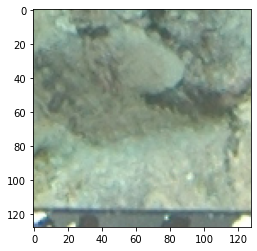

CCA
1754 1207


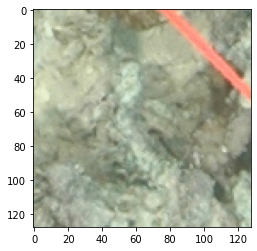

CCA
1234 1126


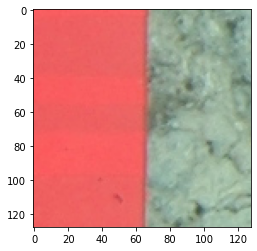

Sand
1232 115


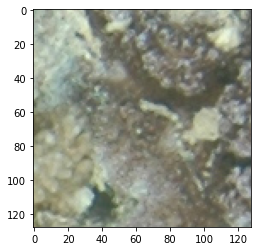

Monti
562 1571


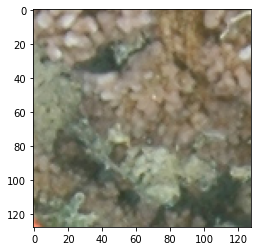

Monti
552 661


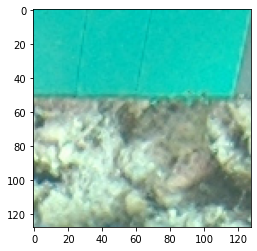

CCA
163 1307


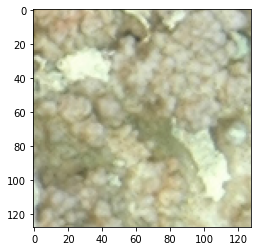

Monti
892 1372


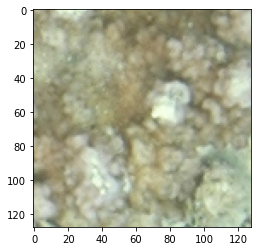

Monti
781 1484


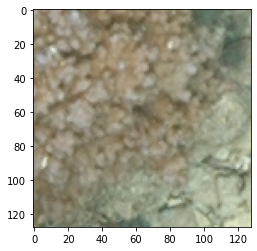

Monti
1012 727


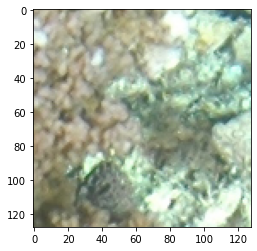

Turf
259 1193


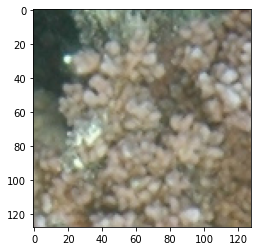

Monti
363 731


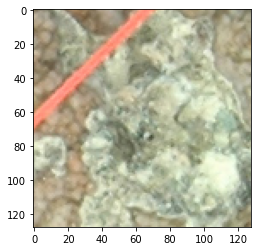

CCA
799 1179


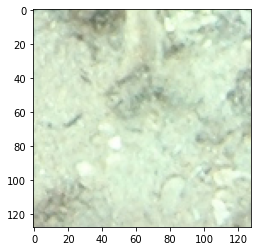

Sand
1535 1265


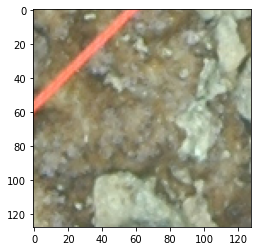

Monti
1272 707


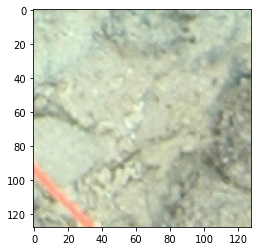

Sand
1482 1540


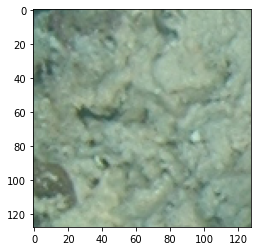

Sand
661 191


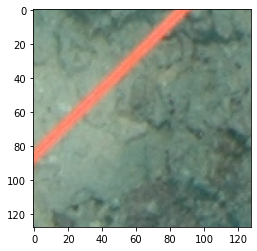

Sand
1561 383


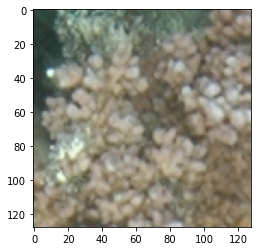

Monti
355 741


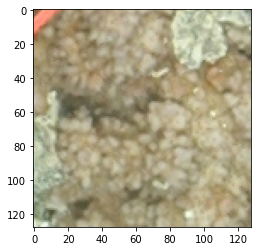

Monti
908 1125


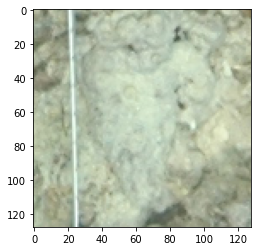

CCA
1211 1021


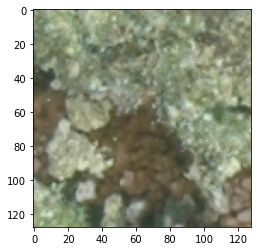

Monti
839 666


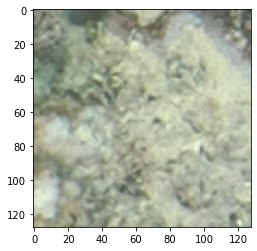

Turf
716 1600


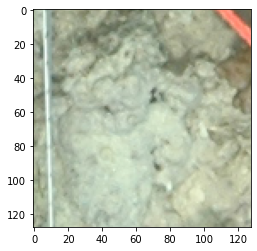

CCA
1175 1035


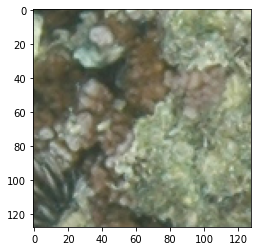

Monti
751 597


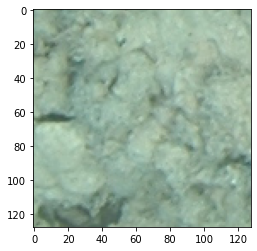

Turf
1282 247


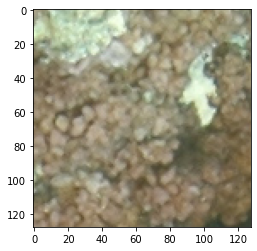

Monti
529 1131


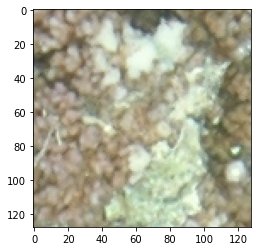

Monti
424 1087


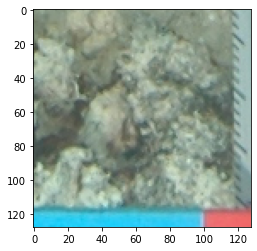

Turf
1750 930


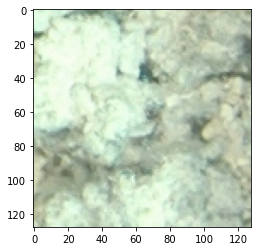

CCA
1159 1480


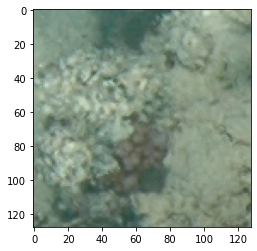

Macro
638 362


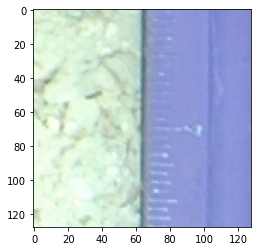

Sand
1237 1775


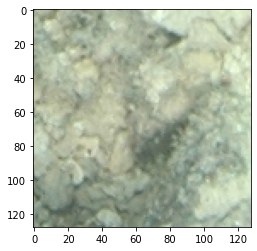

Turf
1541 1098


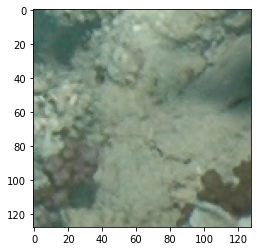

Sand
629 403


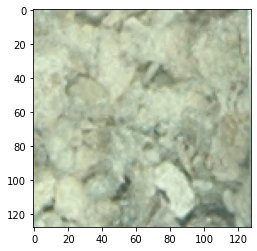

Sand
1254 917


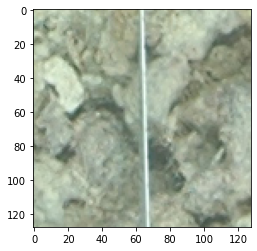

CCA
1316 982


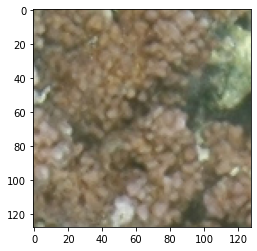

Monti
473 830


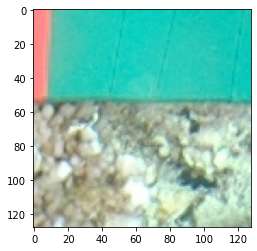

Turf
160 1216


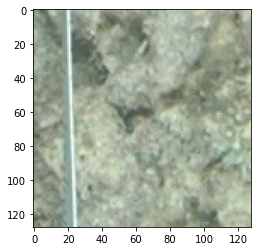

Turf
1379 1027


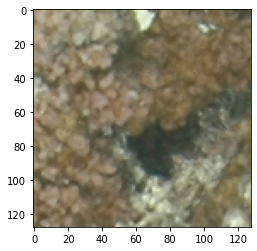

Monti
585 1167


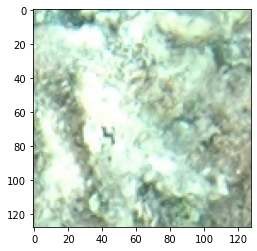

Turf
310 1314


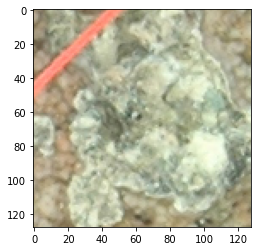

CCA
811 1186


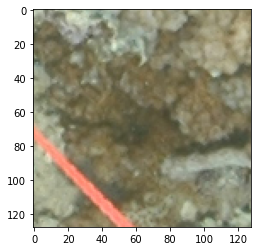

Monti
1083 1127


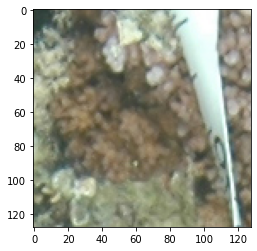

Monti
298 918


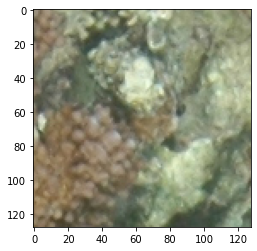

Monti
402 873


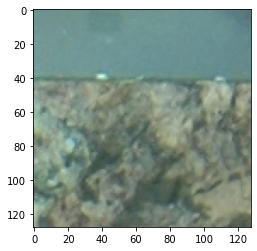

Turf
175 1513


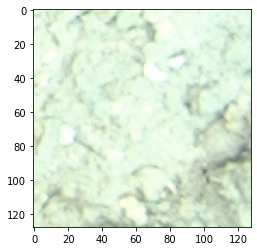

Sand
1369 1682


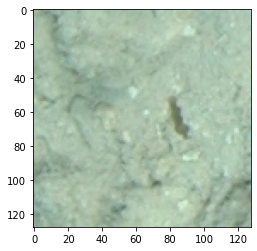

Sand
1225 347


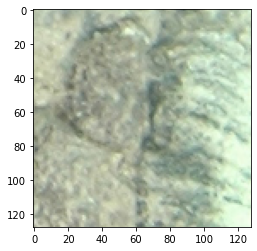

CCA
1509 1626


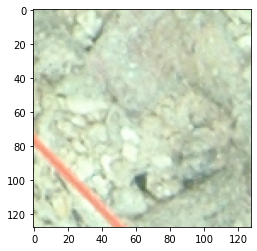

CCA
1360 1403


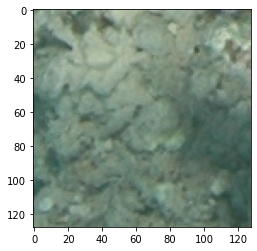

Sand
1495 553


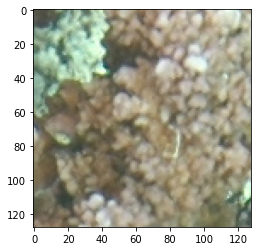

Monti
244 1099


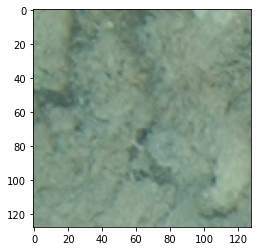

Turf
441 265


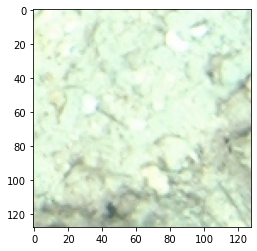

Sand
1387 1669


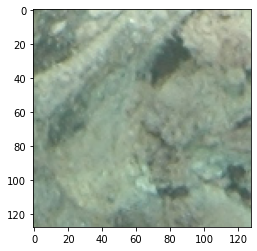

CCA
1660 1160


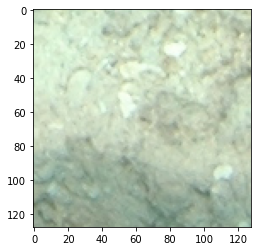

Sand
1598 1320


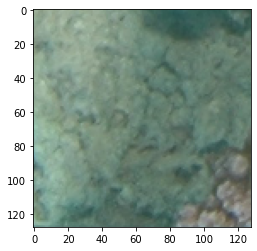

Sand
1733 381


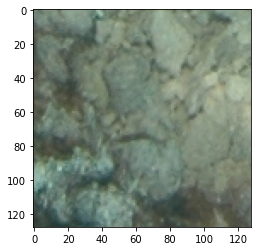

Sand
1667 745


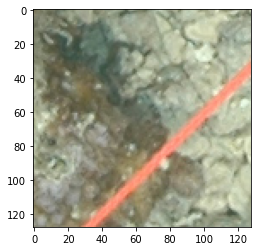

Monti
1127 750


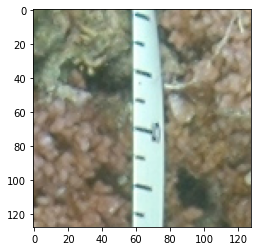

Monti
490 980


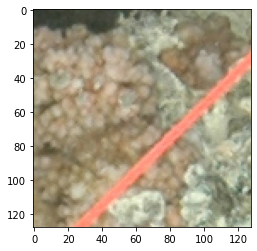

Monti
767 1121


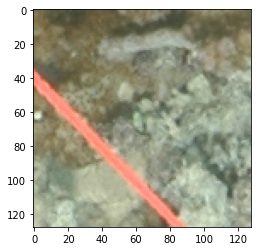

Macro
1153 1164


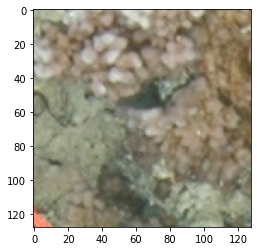

Monti
531 635


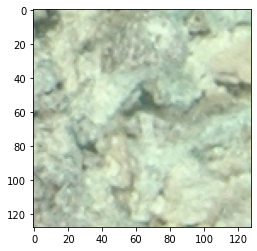

CCA
1229 1346


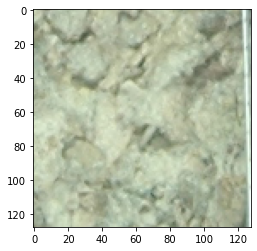

CCA
1217 919


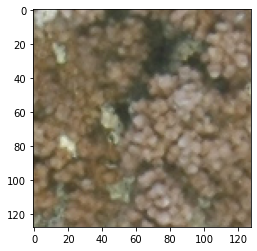

Monti
592 875


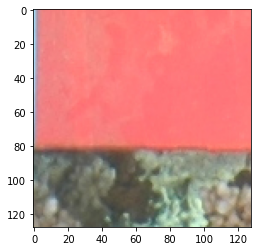

Off
129 1041


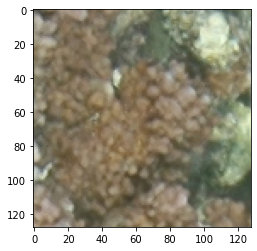

Monti
428 829


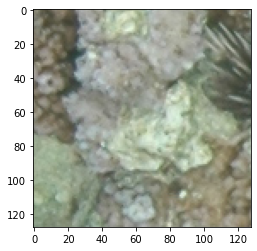

Monti
822 474


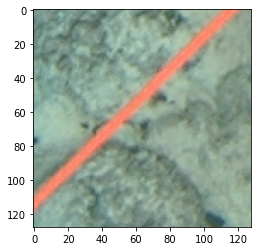

Sand
1656 258


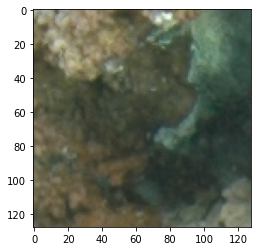

Monti
311 612


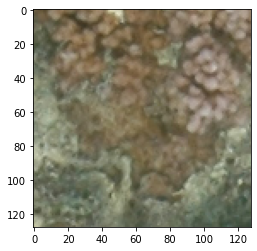

Monti
671 847


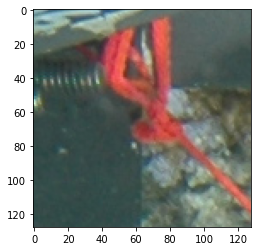

Monti
147 127


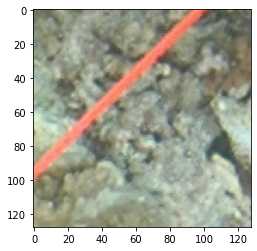

Monti
469 1483


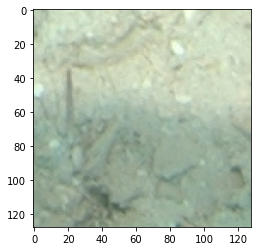

Sand
1646 1431


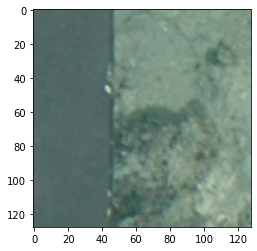

Sand
540 141


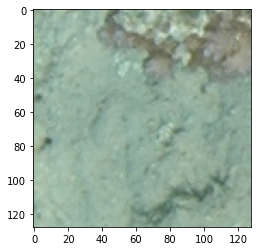

Sand
1041 291


In [7]:
patch_size = 128
convert_tensor = transforms.ToTensor()
image_tensor = convert_tensor(image)

for i in labels.to_numpy():
    
    row,col,lab = i
    
    left = col - patch_size/2
    right = col + patch_size/2
    top = row - patch_size/2
    buttom = row - patch_size/2
    cropped = transforms.functional.crop(image_tensor,int(row-patch_size/2), int(col-patch_size/2), patch_size, patch_size)
#     cropped = transforms.CenterCrop(64)(cropped)
#     cropped = transforms.functional.adjust_contrast(cropped, 3)
# #     cropped = transforms.functional.adjust_saturation(cropped, 2)

#     cropped = transforms.Resize((128,128))(cropped)
#     cropped = cropped/256
    plt.imshow(cropped.permute(1, 2, 0))
    plt.show()
    print(lab)
    print(row,col)
    


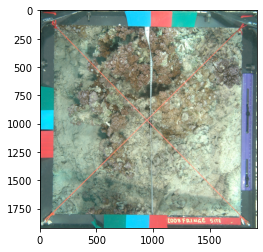

In [7]:
fig, ax = plt.subplots()
ax.imshow(image)


In [226]:
convert_tensor = transforms.ToTensor()

def preprocess(image_list, annotation_list,annotation_name='coral_patches_2009.csv', folder = 'coral_patches_2009', patch_size = 128):
    cnter = 0
    
    final_labs = []
    for image_name, anno_file_name in tqdm(list(zip(image_list,annotation_list))):
        print(image_name)
        print(anno_file_name)
        try:
            labels = pd.read_csv(anno_file_name,sep = ' *; *', names = ["Row", "Col", 'Label'], header=0)
            pil_image = Image.open(image_name)
            image_tensor = convert_tensor(pil_image)

            for i in labels.to_numpy():

                row,col,lab = i 

                final_labs.append((cnter, lab, image_name,row, col))
                x = int(col - int(patch_size)/2)
                y = int(row - int(patch_size)/2)
                cropped = transforms.functional.crop(image_tensor, y ,x , patch_size, patch_size)

                save_image(cropped,folder + '/'+ str(cnter) + '.jpeg')
                cnter +=1
        except ValueError:
            print("failed to read image")
            
    with open(annotation_name,'w') as anof:
        anof.write('{},{},{},{},{}\n'.format('num','label','file_name','row','col'))
        for c, l, i, r, col in final_labs:
            anof.write('{},{},{},{},{}\n'.format(c, l, i, r, col))
            


In [227]:
def get_file_names(folder):
    annos = (glob.glob(folder + "/*.txt"))
    annos = sorted(annos)
    imgs = (glob.glob(folder + "/*.jpg"))
    imgs = sorted(imgs)
    return imgs, annos

In [228]:
test_pics, test_annos = get_file_names('2009')
preprocess(test_pics, test_annos)

  0%|          | 0/695 [00:00<?, ?it/s]<ipython-input-226-f5fcf2efb4bb>:11: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  labels = pd.read_csv(anno_file_name,sep = ' *; *', names = ["Row", "Col", 'Label'], header=0)


2009/mcr_lter1_fringingreef_pole1-2_qu1_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu1_20090402.jpg.txt


  0%|          | 1/695 [00:00<03:42,  3.12it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu2_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu2_20090402.jpg.txt


  0%|          | 2/695 [00:00<04:12,  2.74it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu3_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu3_20090402.jpg.txt


  0%|          | 3/695 [00:01<04:17,  2.68it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu4_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu4_20090402.jpg.txt


  1%|          | 4/695 [00:01<04:03,  2.84it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu5_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu5_20090402.jpg.txt


  1%|          | 5/695 [00:01<04:04,  2.83it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu6_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu6_20090402.jpg.txt


  1%|          | 6/695 [00:02<04:07,  2.78it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu7_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu7_20090402.jpg.txt


  1%|          | 7/695 [00:02<04:13,  2.72it/s]

2009/mcr_lter1_fringingreef_pole1-2_qu8_20090402.jpg
2009/mcr_lter1_fringingreef_pole1-2_qu8_20090402.jpg.txt


  1%|          | 8/695 [00:02<04:02,  2.84it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu1_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu1_20090402.jpg.txt


  1%|▏         | 9/695 [00:03<03:57,  2.89it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu2_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu2_20090402.jpg.txt


  1%|▏         | 10/695 [00:03<03:59,  2.86it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu3_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu3_20090402.jpg.txt


  2%|▏         | 11/695 [00:03<04:00,  2.85it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu4_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu4_20090402.jpg.txt


  2%|▏         | 12/695 [00:04<03:53,  2.93it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu5_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu5_20090402.jpg.txt


  2%|▏         | 13/695 [00:04<04:08,  2.74it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu6_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu6_20090402.jpg.txt


  2%|▏         | 14/695 [00:04<04:07,  2.75it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu7_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu7_20090402.jpg.txt


  2%|▏         | 15/695 [00:05<04:11,  2.71it/s]

2009/mcr_lter1_fringingreef_pole2-3_qu8_20090402.jpg
2009/mcr_lter1_fringingreef_pole2-3_qu8_20090402.jpg.txt


  2%|▏         | 16/695 [00:05<04:15,  2.65it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu1_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu1_20090402.jpg.txt


  2%|▏         | 17/695 [00:06<04:06,  2.75it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu2_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu2_20090402.jpg.txt


  3%|▎         | 18/695 [00:06<04:04,  2.77it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu3_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu3_20090402.jpg.txt


  3%|▎         | 19/695 [00:06<04:00,  2.81it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu4_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu4_20090402.jpg.txt


  3%|▎         | 20/695 [00:07<04:11,  2.68it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu5_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu5_20090402.jpg.txt


  3%|▎         | 21/695 [00:07<04:16,  2.63it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu6_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu6_20090402.jpg.txt


  3%|▎         | 22/695 [00:08<04:30,  2.49it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu7_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu7_20090402.jpg.txt


  3%|▎         | 23/695 [00:08<04:23,  2.55it/s]

2009/mcr_lter1_fringingreef_pole3-4_qu8_20090402.jpg
2009/mcr_lter1_fringingreef_pole3-4_qu8_20090402.jpg.txt


  3%|▎         | 24/695 [00:08<04:26,  2.52it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu1_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu1_20090402.jpg.txt


  4%|▎         | 25/695 [00:09<04:39,  2.40it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu2_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu2_20090402.jpg.txt


  4%|▎         | 26/695 [00:09<04:34,  2.43it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu3_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu3_20090402.jpg.txt


  4%|▍         | 27/695 [00:10<04:16,  2.61it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu4_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu4_20090402.jpg.txt


  4%|▍         | 28/695 [00:10<04:30,  2.47it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu5_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu5_20090402.jpg.txt


  4%|▍         | 29/695 [00:10<04:26,  2.50it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu6_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu6_20090402.jpg.txt


  4%|▍         | 30/695 [00:11<04:21,  2.55it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu7_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu7_20090402.jpg.txt


  4%|▍         | 31/695 [00:11<04:17,  2.58it/s]

2009/mcr_lter1_fringingreef_pole4-5_qu8_20090402.jpg
2009/mcr_lter1_fringingreef_pole4-5_qu8_20090402.jpg.txt


  5%|▍         | 32/695 [00:11<04:05,  2.70it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu1_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu1_20090402.jpg.txt


  5%|▍         | 33/695 [00:12<03:56,  2.80it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu2_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu2_20090402.jpg.txt


  5%|▍         | 34/695 [00:12<03:55,  2.80it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu3_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu3_20090402.jpg.txt


  5%|▌         | 35/695 [00:12<03:54,  2.82it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu4_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu4_20090402.jpg.txt


  5%|▌         | 36/695 [00:13<03:55,  2.79it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu5_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu5_20090402.jpg.txt


  5%|▌         | 37/695 [00:13<04:01,  2.73it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu6_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu6_20090402.jpg.txt


  5%|▌         | 38/695 [00:14<04:14,  2.58it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu7_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu7_20090402.jpg.txt


  6%|▌         | 39/695 [00:14<04:43,  2.31it/s]

2009/mcr_lter1_fringingreef_pole5-6_qu8_20090402.jpg
2009/mcr_lter1_fringingreef_pole5-6_qu8_20090402.jpg.txt


  6%|▌         | 40/695 [00:15<05:10,  2.11it/s]

2009/mcr_lter1_out10m_pole1-2_qu1_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu1_20090330.jpg.txt


  6%|▌         | 41/695 [00:15<04:34,  2.38it/s]

failed to read image
2009/mcr_lter1_out10m_pole1-2_qu2_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu2_20090330.jpg.txt


  6%|▌         | 42/695 [00:15<04:29,  2.42it/s]

failed to read image
2009/mcr_lter1_out10m_pole1-2_qu3_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu3_20090330.jpg.txt


  6%|▋         | 44/695 [00:16<03:30,  3.09it/s]

failed to read image
2009/mcr_lter1_out10m_pole1-2_qu4_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu4_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole1-2_qu5_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu5_20090330.jpg.txt


  7%|▋         | 46/695 [00:17<03:11,  3.39it/s]

failed to read image
2009/mcr_lter1_out10m_pole1-2_qu6_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu6_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole1-2_qu7_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu7_20090330.jpg.txt


  7%|▋         | 47/695 [00:17<03:53,  2.77it/s]

2009/mcr_lter1_out10m_pole1-2_qu8_20090330.jpg
2009/mcr_lter1_out10m_pole1-2_qu8_20090330.jpg.txt


  7%|▋         | 49/695 [00:18<03:22,  3.19it/s]

failed to read image
2009/mcr_lter1_out10m_pole2-3_qu1_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu1_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole2-3_qu2_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu2_20090330.jpg.txt


  7%|▋         | 50/695 [00:18<03:14,  3.32it/s]

failed to read image
2009/mcr_lter1_out10m_pole2-3_qu3_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu3_20090330.jpg.txt


  7%|▋         | 51/695 [00:18<03:14,  3.31it/s]

failed to read image
2009/mcr_lter1_out10m_pole2-3_qu4_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu4_20090330.jpg.txt


  8%|▊         | 53/695 [00:19<02:43,  3.92it/s]

failed to read image
2009/mcr_lter1_out10m_pole2-3_qu5_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu5_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole2-3_qu6_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu6_20090330.jpg.txt


  8%|▊         | 54/695 [00:19<03:00,  3.56it/s]

2009/mcr_lter1_out10m_pole2-3_qu7_20090330.jpg
2009/mcr_lter1_out10m_pole2-3_qu7_20090330.jpg.txt


  8%|▊         | 55/695 [00:19<03:27,  3.09it/s]

2009/mcr_lter1_out10m_pole3-4_qu1_20090330.jpg
2009/mcr_lter1_out10m_pole3-4_qu1_20090330.jpg.txt


  8%|▊         | 56/695 [00:20<03:39,  2.91it/s]

2009/mcr_lter1_out10m_pole3-4_qu2_20090330.jpg
2009/mcr_lter1_out10m_pole3-4_qu2_20090330.jpg.txt


  8%|▊         | 58/695 [00:20<03:08,  3.38it/s]

2009/mcr_lter1_out10m_pole3-4_qu3_20090330.jpg
2009/mcr_lter1_out10m_pole3-4_qu3_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole3-4_qu4_20090330.jpg
2009/mcr_lter1_out10m_pole3-4_qu4_20090330.jpg.txt


  9%|▊         | 60/695 [00:21<02:18,  4.57it/s]

failed to read image
2009/mcr_lter1_out10m_pole3-4_qu5_20090330.jpg
2009/mcr_lter1_out10m_pole3-4_qu5_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole3-4_qu6_20090330.jpg
2009/mcr_lter1_out10m_pole3-4_qu6_20090330.jpg.txt


  9%|▉         | 61/695 [00:21<02:42,  3.91it/s]

2009/mcr_lter1_out10m_pole4-5_qu1_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu1_20090330.jpg.txt


  9%|▉         | 62/695 [00:21<02:40,  3.94it/s]

failed to read image
2009/mcr_lter1_out10m_pole4-5_qu2_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu2_20090330.jpg.txt


  9%|▉         | 64/695 [00:22<02:38,  3.99it/s]

failed to read image
2009/mcr_lter1_out10m_pole4-5_qu3_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu3_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole4-5_qu4_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu4_20090330.jpg.txt


  9%|▉         | 65/695 [00:22<02:28,  4.23it/s]

failed to read image
2009/mcr_lter1_out10m_pole4-5_qu5_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu5_20090330.jpg.txt


  9%|▉         | 66/695 [00:22<02:47,  3.75it/s]

2009/mcr_lter1_out10m_pole4-5_qu6_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu6_20090330.jpg.txt


 10%|▉         | 67/695 [00:23<03:06,  3.37it/s]

2009/mcr_lter1_out10m_pole4-5_qu7_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu7_20090330.jpg.txt


 10%|▉         | 69/695 [00:23<02:55,  3.56it/s]

2009/mcr_lter1_out10m_pole4-5_qu8_20090330.jpg
2009/mcr_lter1_out10m_pole4-5_qu8_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole5-6_qu1_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu1_20090330.jpg.txt


 10%|█         | 70/695 [00:24<03:06,  3.35it/s]

failed to read image
2009/mcr_lter1_out10m_pole5-6_qu2_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu2_20090330.jpg.txt


 10%|█         | 71/695 [00:24<02:48,  3.70it/s]

failed to read image
2009/mcr_lter1_out10m_pole5-6_qu3_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu3_20090330.jpg.txt


 10%|█         | 72/695 [00:24<03:11,  3.25it/s]

2009/mcr_lter1_out10m_pole5-6_qu4_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu4_20090330.jpg.txt


 11%|█         | 74/695 [00:25<02:57,  3.50it/s]

2009/mcr_lter1_out10m_pole5-6_qu5_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu5_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out10m_pole5-6_qu6_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu6_20090330.jpg.txt


 11%|█         | 75/695 [00:25<02:49,  3.65it/s]

failed to read image
2009/mcr_lter1_out10m_pole5-6_qu7_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu7_20090330.jpg.txt


 11%|█         | 76/695 [00:25<03:07,  3.29it/s]

2009/mcr_lter1_out10m_pole5-6_qu8_20090330.jpg
2009/mcr_lter1_out10m_pole5-6_qu8_20090330.jpg.txt


 11%|█         | 78/695 [00:26<02:37,  3.91it/s]

failed to read image
2009/mcr_lter1_out17m_pole1-2_qu2_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu2_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole1-2_qu3_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu3_20090330.jpg.txt


 11%|█▏        | 79/695 [00:26<02:14,  4.59it/s]

failed to read image
2009/mcr_lter1_out17m_pole1-2_qu4_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu4_20090330.jpg.txt


 12%|█▏        | 81/695 [00:26<02:00,  5.10it/s]

failed to read image
2009/mcr_lter1_out17m_pole1-2_qu5_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu5_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole1-2_qu6_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu6_20090330.jpg.txt


 12%|█▏        | 82/695 [00:27<02:27,  4.15it/s]

2009/mcr_lter1_out17m_pole1-2_qu7_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu7_20090330.jpg.txt


 12%|█▏        | 84/695 [00:27<02:30,  4.05it/s]

2009/mcr_lter1_out17m_pole1-2_qu8_20090330.jpg
2009/mcr_lter1_out17m_pole1-2_qu8_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole2-3_qu1_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu1_20090330.jpg.txt


 12%|█▏        | 85/695 [00:27<02:21,  4.32it/s]

failed to read image
2009/mcr_lter1_out17m_pole2-3_qu2_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu2_20090330.jpg.txt


 12%|█▏        | 86/695 [00:28<02:39,  3.81it/s]

2009/mcr_lter1_out17m_pole2-3_qu3_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu3_20090330.jpg.txt


 13%|█▎        | 88/695 [00:28<02:35,  3.91it/s]

failed to read image
2009/mcr_lter1_out17m_pole2-3_qu4_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu4_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole2-3_qu5_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu5_20090330.jpg.txt


 13%|█▎        | 90/695 [00:29<02:24,  4.20it/s]

2009/mcr_lter1_out17m_pole2-3_qu6_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu6_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole2-3_qu7_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu7_20090330.jpg.txt


 13%|█▎        | 91/695 [00:29<02:35,  3.88it/s]

2009/mcr_lter1_out17m_pole2-3_qu8_20090330.jpg
2009/mcr_lter1_out17m_pole2-3_qu8_20090330.jpg.txt


 13%|█▎        | 92/695 [00:29<02:28,  4.07it/s]

failed to read image
2009/mcr_lter1_out17m_pole3-4_qu1_20090330.jpg
2009/mcr_lter1_out17m_pole3-4_qu1_20090330.jpg.txt


 13%|█▎        | 93/695 [00:30<02:43,  3.69it/s]

2009/mcr_lter1_out17m_pole3-4_qu2_20090330.jpg
2009/mcr_lter1_out17m_pole3-4_qu2_20090330.jpg.txt


 14%|█▎        | 94/695 [00:30<02:36,  3.84it/s]

failed to read image
2009/mcr_lter1_out17m_pole3-4_qu3_20090330.jpg
2009/mcr_lter1_out17m_pole3-4_qu3_20090330.jpg.txt


 14%|█▎        | 95/695 [00:30<02:49,  3.54it/s]

2009/mcr_lter1_out17m_pole3-4_qu4_20090330.jpg
2009/mcr_lter1_out17m_pole3-4_qu4_20090330.jpg.txt


 14%|█▍        | 96/695 [00:30<03:03,  3.27it/s]

2009/mcr_lter1_out17m_pole3-4_qu5_20090330.jpg
2009/mcr_lter1_out17m_pole3-4_qu5_20090330.jpg.txt


 14%|█▍        | 97/695 [00:31<03:07,  3.19it/s]

2009/mcr_lter1_out17m_pole3-4_qu6_20090330.jpg
2009/mcr_lter1_out17m_pole3-4_qu6_20090330.jpg.txt


 14%|█▍        | 98/695 [00:31<03:04,  3.24it/s]

failed to read image
2009/mcr_lter1_out17m_pole4-5_qu1_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu1_20090330.jpg.txt


 14%|█▍        | 99/695 [00:31<02:59,  3.32it/s]

failed to read image
2009/mcr_lter1_out17m_pole4-5_qu2_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu2_20090330.jpg.txt


 15%|█▍        | 101/695 [00:32<02:47,  3.55it/s]

2009/mcr_lter1_out17m_pole4-5_qu3_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu3_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole4-5_qu4_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu4_20090330.jpg.txt


 15%|█▍        | 102/695 [00:32<03:02,  3.26it/s]

2009/mcr_lter1_out17m_pole4-5_qu5_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu5_20090330.jpg.txt


 15%|█▍        | 104/695 [00:33<02:46,  3.54it/s]

2009/mcr_lter1_out17m_pole4-5_qu6_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu6_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole4-5_qu7_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu7_20090330.jpg.txt


 15%|█▌        | 105/695 [00:33<03:00,  3.27it/s]

2009/mcr_lter1_out17m_pole4-5_qu8_20090330.jpg
2009/mcr_lter1_out17m_pole4-5_qu8_20090330.jpg.txt


 15%|█▌        | 106/695 [00:34<03:08,  3.13it/s]

2009/mcr_lter1_out17m_pole5-6_qu1_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu1_20090330.jpg.txt


 15%|█▌        | 107/695 [00:34<03:17,  2.98it/s]

2009/mcr_lter1_out17m_pole5-6_qu2_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu2_20090330.jpg.txt


 16%|█▌        | 108/695 [00:34<03:16,  2.98it/s]

2009/mcr_lter1_out17m_pole5-6_qu3_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu3_20090330.jpg.txt


 16%|█▌        | 110/695 [00:35<02:51,  3.40it/s]

2009/mcr_lter1_out17m_pole5-6_qu4_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu4_20090330.jpg.txt
failed to read image
2009/mcr_lter1_out17m_pole5-6_qu5_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu5_20090330.jpg.txt


 16%|█▌        | 111/695 [00:35<02:39,  3.65it/s]

failed to read image
2009/mcr_lter1_out17m_pole5-6_qu6_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu6_20090330.jpg.txt


 16%|█▌        | 112/695 [00:35<02:53,  3.37it/s]

2009/mcr_lter1_out17m_pole5-6_qu7_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu7_20090330.jpg.txt


 16%|█▋        | 114/695 [00:36<02:27,  3.93it/s]

failed to read image
2009/mcr_lter1_out17m_pole5-6_qu8_20090330.jpg
2009/mcr_lter1_out17m_pole5-6_qu8_20090330.jpg.txt
failed to read image
2009/mcr_lter2_fringingreef_pole1-2_qu1_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu1_20090402.jpg.txt


 17%|█▋        | 115/695 [00:36<02:47,  3.47it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu2_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu2_20090402.jpg.txt


 17%|█▋        | 116/695 [00:37<03:00,  3.21it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu3_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu3_20090402.jpg.txt


 17%|█▋        | 117/695 [00:37<03:07,  3.09it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu4_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu4_20090402.jpg.txt


 17%|█▋        | 118/695 [00:37<03:20,  2.88it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu5_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu5_20090402.jpg.txt


 17%|█▋        | 119/695 [00:38<03:18,  2.91it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu6_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu6_20090402.jpg.txt


 17%|█▋        | 120/695 [00:38<03:15,  2.94it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu7_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu7_20090402.jpg.txt


 17%|█▋        | 121/695 [00:38<03:24,  2.81it/s]

2009/mcr_lter2_fringingreef_pole1-2_qu8_20090402.jpg
2009/mcr_lter2_fringingreef_pole1-2_qu8_20090402.jpg.txt


 18%|█▊        | 122/695 [00:39<03:20,  2.85it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu1_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu1_20090402.jpg.txt


 18%|█▊        | 123/695 [00:39<03:24,  2.79it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu2_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu2_20090402.jpg.txt


 18%|█▊        | 124/695 [00:39<03:25,  2.79it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu3_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu3_20090402.jpg.txt


 18%|█▊        | 125/695 [00:40<03:30,  2.70it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu4_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu4_20090402.jpg.txt


 18%|█▊        | 126/695 [00:40<03:16,  2.89it/s]

failed to read image
2009/mcr_lter2_fringingreef_pole2-3_qu5_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu5_20090402.jpg.txt


 18%|█▊        | 127/695 [00:40<03:14,  2.92it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu6_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu6_20090402.jpg.txt


 18%|█▊        | 128/695 [00:41<03:18,  2.85it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu7_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu7_20090402.jpg.txt


 19%|█▊        | 129/695 [00:41<03:11,  2.96it/s]

2009/mcr_lter2_fringingreef_pole2-3_qu8_20090402.jpg
2009/mcr_lter2_fringingreef_pole2-3_qu8_20090402.jpg.txt


 19%|█▊        | 130/695 [00:41<03:07,  3.01it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu1_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu1_20090402.jpg.txt


 19%|█▉        | 131/695 [00:42<03:13,  2.91it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu2_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu2_20090402.jpg.txt


 19%|█▉        | 132/695 [00:42<03:19,  2.83it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu3_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu3_20090402.jpg.txt


 19%|█▉        | 133/695 [00:43<03:18,  2.83it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu4_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu4_20090402.jpg.txt


 19%|█▉        | 134/695 [00:43<03:23,  2.76it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu5_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu5_20090402.jpg.txt


 19%|█▉        | 135/695 [00:43<03:18,  2.82it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu6_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu6_20090402.jpg.txt


 20%|█▉        | 136/695 [00:44<03:10,  2.94it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu7_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu7_20090402.jpg.txt


 20%|█▉        | 137/695 [00:44<03:14,  2.87it/s]

2009/mcr_lter2_fringingreef_pole3-4_qu8_20090402.jpg
2009/mcr_lter2_fringingreef_pole3-4_qu8_20090402.jpg.txt


 20%|█▉        | 138/695 [00:44<03:15,  2.86it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu1_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu1_20090402.jpg.txt


 20%|██        | 139/695 [00:45<03:13,  2.87it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu2_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu2_20090402.jpg.txt


 20%|██        | 140/695 [00:45<03:22,  2.74it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu3_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu3_20090402.jpg.txt


 20%|██        | 141/695 [00:45<03:18,  2.79it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu4_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu4_20090402.jpg.txt


 20%|██        | 142/695 [00:46<03:14,  2.84it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu5_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu5_20090402.jpg.txt


 21%|██        | 143/695 [00:46<03:14,  2.84it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu6_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu6_20090402.jpg.txt


 21%|██        | 144/695 [00:46<03:16,  2.80it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu7_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu7_20090402.jpg.txt


 21%|██        | 145/695 [00:47<03:15,  2.81it/s]

2009/mcr_lter2_fringingreef_pole4-5_qu8_20090402.jpg
2009/mcr_lter2_fringingreef_pole4-5_qu8_20090402.jpg.txt


 21%|██        | 146/695 [00:47<03:15,  2.80it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu1_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu1_20090402.jpg.txt


 21%|██        | 147/695 [00:48<03:17,  2.77it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu2_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu2_20090402.jpg.txt


 21%|██▏       | 148/695 [00:48<03:15,  2.79it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu3_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu3_20090402.jpg.txt


 21%|██▏       | 149/695 [00:48<03:12,  2.84it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu4_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu4_20090402.jpg.txt


 22%|██▏       | 150/695 [00:49<03:21,  2.70it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu5_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu5_20090402.jpg.txt


 22%|██▏       | 151/695 [00:49<03:15,  2.78it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu6_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu6_20090402.jpg.txt


 22%|██▏       | 152/695 [00:49<03:12,  2.82it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu7_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu7_20090402.jpg.txt


 22%|██▏       | 153/695 [00:50<03:14,  2.79it/s]

2009/mcr_lter2_fringingreef_pole5-6_qu8_20090402.jpg
2009/mcr_lter2_fringingreef_pole5-6_qu8_20090402.jpg.txt


 22%|██▏       | 155/695 [00:50<02:35,  3.48it/s]

2009/mcr_lter2_out10m_pole1-2_qu1_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu1_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out10m_pole1-2_qu2_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu2_20090408.jpg.txt


 22%|██▏       | 156/695 [00:50<02:35,  3.47it/s]

failed to read image
2009/mcr_lter2_out10m_pole1-2_qu3_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu3_20090408.jpg.txt


 23%|██▎       | 157/695 [00:51<02:36,  3.43it/s]

failed to read image
2009/mcr_lter2_out10m_pole1-2_qu4_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu4_20090408.jpg.txt


 23%|██▎       | 158/695 [00:51<02:49,  3.17it/s]

2009/mcr_lter2_out10m_pole1-2_qu5_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu5_20090408.jpg.txt


 23%|██▎       | 159/695 [00:51<02:57,  3.01it/s]

failed to read image
2009/mcr_lter2_out10m_pole1-2_qu6_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu6_20090408.jpg.txt


 23%|██▎       | 160/695 [00:52<03:00,  2.97it/s]

failed to read image
2009/mcr_lter2_out10m_pole1-2_qu7_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu7_20090408.jpg.txt


 23%|██▎       | 161/695 [00:52<03:10,  2.80it/s]

2009/mcr_lter2_out10m_pole1-2_qu8_20090408.jpg
2009/mcr_lter2_out10m_pole1-2_qu8_20090408.jpg.txt


 23%|██▎       | 162/695 [00:52<02:50,  3.12it/s]

failed to read image
2009/mcr_lter2_out10m_pole2-3_qu1_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu1_20090408.jpg.txt


 23%|██▎       | 163/695 [00:53<02:54,  3.04it/s]

failed to read image
2009/mcr_lter2_out10m_pole2-3_qu2_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu2_20090408.jpg.txt


 24%|██▎       | 164/695 [00:53<03:03,  2.89it/s]

2009/mcr_lter2_out10m_pole2-3_qu3_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu3_20090408.jpg.txt


 24%|██▎       | 165/695 [00:54<03:04,  2.87it/s]

2009/mcr_lter2_out10m_pole2-3_qu4_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu4_20090408.jpg.txt


 24%|██▍       | 166/695 [00:54<02:58,  2.96it/s]

failed to read image
2009/mcr_lter2_out10m_pole2-3_qu5_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu5_20090408.jpg.txt


 24%|██▍       | 168/695 [00:54<02:41,  3.26it/s]

2009/mcr_lter2_out10m_pole2-3_qu6_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu6_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out10m_pole2-3_qu7_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu7_20090408.jpg.txt


 24%|██▍       | 170/695 [00:55<02:18,  3.79it/s]

failed to read image
2009/mcr_lter2_out10m_pole2-3_qu8_20090408.jpg
2009/mcr_lter2_out10m_pole2-3_qu8_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out10m_pole3-4_qu1_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu1_20090408.jpg.txt


 25%|██▍       | 171/695 [00:55<02:23,  3.65it/s]

failed to read image
2009/mcr_lter2_out10m_pole3-4_qu2_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu2_20090408.jpg.txt


 25%|██▍       | 172/695 [00:55<02:16,  3.84it/s]

failed to read image
2009/mcr_lter2_out10m_pole3-4_qu3_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu3_20090408.jpg.txt


 25%|██▍       | 173/695 [00:56<02:39,  3.28it/s]

2009/mcr_lter2_out10m_pole3-4_qu4_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu4_20090408.jpg.txt


 25%|██▌       | 174/695 [00:56<02:49,  3.08it/s]

2009/mcr_lter2_out10m_pole3-4_qu5_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu5_20090408.jpg.txt


 25%|██▌       | 175/695 [00:57<02:59,  2.90it/s]

failed to read image
2009/mcr_lter2_out10m_pole3-4_qu6_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu6_20090408.jpg.txt


 25%|██▌       | 176/695 [00:57<03:01,  2.85it/s]

2009/mcr_lter2_out10m_pole3-4_qu7_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu7_20090408.jpg.txt


 26%|██▌       | 178/695 [00:58<02:39,  3.25it/s]

2009/mcr_lter2_out10m_pole3-4_qu8_20090408.jpg
2009/mcr_lter2_out10m_pole3-4_qu8_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out10m_pole4-5_qu1_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu1_20090408.jpg.txt


 26%|██▌       | 180/695 [00:58<02:05,  4.10it/s]

failed to read image
2009/mcr_lter2_out10m_pole4-5_qu2_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu2_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out10m_pole4-5_qu3_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu3_20090408.jpg.txt


 26%|██▌       | 181/695 [00:58<02:03,  4.16it/s]

failed to read image
2009/mcr_lter2_out10m_pole4-5_qu4_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu4_20090408.jpg.txt


 26%|██▌       | 182/695 [00:59<02:24,  3.55it/s]

2009/mcr_lter2_out10m_pole4-5_qu5_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu5_20090408.jpg.txt


 26%|██▋       | 183/695 [00:59<02:17,  3.72it/s]

failed to read image
2009/mcr_lter2_out10m_pole4-5_qu6_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu6_20090408.jpg.txt


 26%|██▋       | 184/695 [00:59<02:10,  3.93it/s]

failed to read image
2009/mcr_lter2_out10m_pole4-5_qu7_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu7_20090408.jpg.txt


 27%|██▋       | 185/695 [00:59<02:23,  3.55it/s]

failed to read image
2009/mcr_lter2_out10m_pole4-5_qu8_20090408.jpg
2009/mcr_lter2_out10m_pole4-5_qu8_20090408.jpg.txt


 27%|██▋       | 186/695 [01:00<02:38,  3.21it/s]

failed to read image
2009/mcr_lter2_out10m_pole5-6_qu1_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu1_20090408.jpg.txt


 27%|██▋       | 187/695 [01:00<02:50,  2.97it/s]

2009/mcr_lter2_out10m_pole5-6_qu2_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu2_20090408.jpg.txt


 27%|██▋       | 188/695 [01:00<02:36,  3.24it/s]

failed to read image
2009/mcr_lter2_out10m_pole5-6_qu3_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu3_20090408.jpg.txt


 27%|██▋       | 189/695 [01:01<02:30,  3.37it/s]

failed to read image
2009/mcr_lter2_out10m_pole5-6_qu4_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu4_20090408.jpg.txt


 27%|██▋       | 190/695 [01:01<02:24,  3.51it/s]

failed to read image
2009/mcr_lter2_out10m_pole5-6_qu5_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu5_20090408.jpg.txt


 28%|██▊       | 192/695 [01:01<02:15,  3.71it/s]

2009/mcr_lter2_out10m_pole5-6_qu6_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu6_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out10m_pole5-6_qu7_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu7_20090408.jpg.txt


 28%|██▊       | 193/695 [01:02<02:24,  3.48it/s]

2009/mcr_lter2_out10m_pole5-6_qu8_20090408.jpg
2009/mcr_lter2_out10m_pole5-6_qu8_20090408.jpg.txt


 28%|██▊       | 195/695 [01:02<02:13,  3.73it/s]

2009/mcr_lter2_out17m_pole1-2_qu1_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu1_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole1-2_qu2_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu2_20090408.jpg.txt


 28%|██▊       | 196/695 [01:03<02:12,  3.77it/s]

failed to read image
2009/mcr_lter2_out17m_pole1-2_qu3_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu3_20090408.jpg.txt


 28%|██▊       | 197/695 [01:03<02:07,  3.89it/s]

failed to read image
2009/mcr_lter2_out17m_pole1-2_qu4_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu4_20090408.jpg.txt


 29%|██▊       | 199/695 [01:03<02:08,  3.87it/s]

2009/mcr_lter2_out17m_pole1-2_qu5_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu5_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole1-2_qu6_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu6_20090408.jpg.txt


 29%|██▉       | 201/695 [01:04<02:06,  3.90it/s]

2009/mcr_lter2_out17m_pole1-2_qu7_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu7_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole1-2_qu8_20090408.jpg
2009/mcr_lter2_out17m_pole1-2_qu8_20090408.jpg.txt


 29%|██▉       | 202/695 [01:04<02:27,  3.35it/s]

2009/mcr_lter2_out17m_pole2-3_qu1_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu1_20090408.jpg.txt


 29%|██▉       | 203/695 [01:05<02:19,  3.53it/s]

failed to read image
2009/mcr_lter2_out17m_pole2-3_qu2_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu2_20090408.jpg.txt


 29%|██▉       | 204/695 [01:05<02:32,  3.21it/s]

2009/mcr_lter2_out17m_pole2-3_qu3_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu3_20090408.jpg.txt


 29%|██▉       | 205/695 [01:05<02:41,  3.04it/s]

2009/mcr_lter2_out17m_pole2-3_qu4_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu4_20090408.jpg.txt


 30%|██▉       | 206/695 [01:06<02:47,  2.92it/s]

failed to read image
2009/mcr_lter2_out17m_pole2-3_qu5_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu5_20090408.jpg.txt


 30%|██▉       | 207/695 [01:06<02:36,  3.12it/s]

failed to read image
2009/mcr_lter2_out17m_pole2-3_qu6_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu6_20090408.jpg.txt


 30%|██▉       | 208/695 [01:06<02:46,  2.93it/s]

2009/mcr_lter2_out17m_pole2-3_qu7_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu7_20090408.jpg.txt


 30%|███       | 209/695 [01:07<02:55,  2.76it/s]

2009/mcr_lter2_out17m_pole2-3_qu8_20090408.jpg
2009/mcr_lter2_out17m_pole2-3_qu8_20090408.jpg.txt


 30%|███       | 210/695 [01:07<02:55,  2.76it/s]

2009/mcr_lter2_out17m_pole3-4_qu1_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu1_20090408.jpg.txt


 30%|███       | 211/695 [01:07<02:55,  2.76it/s]

2009/mcr_lter2_out17m_pole3-4_qu2_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu2_20090408.jpg.txt


 31%|███       | 212/695 [01:08<02:43,  2.96it/s]

failed to read image
2009/mcr_lter2_out17m_pole3-4_qu3_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu3_20090408.jpg.txt


 31%|███       | 213/695 [01:08<02:46,  2.90it/s]

2009/mcr_lter2_out17m_pole3-4_qu4_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu4_20090408.jpg.txt


 31%|███       | 215/695 [01:09<02:14,  3.57it/s]

failed to read image
2009/mcr_lter2_out17m_pole3-4_qu5_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu5_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole3-4_qu6_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu6_20090408.jpg.txt


 31%|███       | 217/695 [01:09<01:45,  4.54it/s]

failed to read image
2009/mcr_lter2_out17m_pole3-4_qu7_20090408.jpg
2009/mcr_lter2_out17m_pole3-4_qu7_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole4-5_qu1_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu1_20090408.jpg.txt


 31%|███▏      | 218/695 [01:09<02:05,  3.79it/s]

2009/mcr_lter2_out17m_pole4-5_qu2_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu2_20090408.jpg.txt


 32%|███▏      | 219/695 [01:10<02:18,  3.45it/s]

2009/mcr_lter2_out17m_pole4-5_qu3_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu3_20090408.jpg.txt


 32%|███▏      | 220/695 [01:10<02:28,  3.20it/s]

2009/mcr_lter2_out17m_pole4-5_qu4_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu4_20090408.jpg.txt


 32%|███▏      | 221/695 [01:10<02:26,  3.24it/s]

2009/mcr_lter2_out17m_pole4-5_qu5_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu5_20090408.jpg.txt


 32%|███▏      | 222/695 [01:11<02:32,  3.11it/s]

2009/mcr_lter2_out17m_pole4-5_qu6_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu6_20090408.jpg.txt


 32%|███▏      | 223/695 [01:11<02:36,  3.01it/s]

failed to read image
2009/mcr_lter2_out17m_pole4-5_qu7_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu7_20090408.jpg.txt


 32%|███▏      | 225/695 [01:11<02:02,  3.84it/s]

failed to read image
2009/mcr_lter2_out17m_pole4-5_qu8_20090408.jpg
2009/mcr_lter2_out17m_pole4-5_qu8_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole5-6_qu1_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu1_20090408.jpg.txt


 33%|███▎      | 226/695 [01:12<02:15,  3.45it/s]

2009/mcr_lter2_out17m_pole5-6_qu2_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu2_20090408.jpg.txt


 33%|███▎      | 227/695 [01:12<02:30,  3.11it/s]

2009/mcr_lter2_out17m_pole5-6_qu3_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu3_20090408.jpg.txt


 33%|███▎      | 228/695 [01:12<02:23,  3.25it/s]

failed to read image
2009/mcr_lter2_out17m_pole5-6_qu4_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu4_20090408.jpg.txt


 33%|███▎      | 230/695 [01:13<02:07,  3.65it/s]

2009/mcr_lter2_out17m_pole5-6_qu5_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu5_20090408.jpg.txt
failed to read image
2009/mcr_lter2_out17m_pole5-6_qu6_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu6_20090408.jpg.txt


 33%|███▎      | 231/695 [01:13<02:22,  3.26it/s]

2009/mcr_lter2_out17m_pole5-6_qu7_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu7_20090408.jpg.txt


 33%|███▎      | 232/695 [01:14<02:33,  3.02it/s]

2009/mcr_lter2_out17m_pole5-6_qu8_20090408.jpg
2009/mcr_lter2_out17m_pole5-6_qu8_20090408.jpg.txt


 34%|███▎      | 234/695 [01:14<02:14,  3.43it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu1_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu1_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu2_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu2_20090412.jpg.txt


 34%|███▍      | 236/695 [01:15<01:39,  4.62it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu3_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu3_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu4_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu4_20090412.jpg.txt


 34%|███▍      | 238/695 [01:15<01:41,  4.51it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu5_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu5_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu6_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu6_20090412.jpg.txt


 34%|███▍      | 239/695 [01:15<01:29,  5.11it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole1-2_qu8_20090412.jpg
2009/mcr_lter3_fringingreef_pole1-2_qu8_20090412.jpg.txt


 35%|███▍      | 241/695 [01:16<01:42,  4.42it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu1_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu1_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu2_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu2_20090412.jpg.txt


 35%|███▍      | 243/695 [01:16<01:24,  5.33it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu3_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu3_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu4_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu4_20090412.jpg.txt


 35%|███▌      | 245/695 [01:16<01:29,  5.02it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu5_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu5_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu6_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu6_20090412.jpg.txt


 35%|███▌      | 246/695 [01:17<01:18,  5.69it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu7_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu7_20090412.jpg.txt


 36%|███▌      | 248/695 [01:17<01:16,  5.81it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole2-3_qu8_20090412.jpg
2009/mcr_lter3_fringingreef_pole2-3_qu8_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu1_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu1_20090412.jpg.txt


 36%|███▌      | 250/695 [01:17<01:13,  6.04it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu2_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu2_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu3_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu3_20090412.jpg.txt


 36%|███▋      | 252/695 [01:18<01:17,  5.75it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu4_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu4_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu5_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu5_20090412.jpg.txt


 36%|███▋      | 253/695 [01:18<01:16,  5.80it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu6_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu6_20090412.jpg.txt


 37%|███▋      | 254/695 [01:18<01:30,  4.87it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu7_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu7_20090412.jpg.txt


 37%|███▋      | 256/695 [01:19<01:35,  4.61it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole3-4_qu8_20090412.jpg
2009/mcr_lter3_fringingreef_pole3-4_qu8_20090412.jpg.txt
failed to read image


 37%|███▋      | 257/695 [01:19<01:24,  5.21it/s]

2009/mcr_lter3_fringingreef_pole4-5_qu1_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu1_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu2_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu2_20090412.jpg.txt


 37%|███▋      | 258/695 [01:19<01:17,  5.62it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu3_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu3_20090412.jpg.txt


 37%|███▋      | 260/695 [01:19<01:17,  5.60it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu4_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu4_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu5_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu5_20090412.jpg.txt


 38%|███▊      | 262/695 [01:19<01:10,  6.11it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu6_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu6_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu7_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu7_20090412.jpg.txt


 38%|███▊      | 264/695 [01:20<01:02,  6.94it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole4-5_qu8_20090412.jpg
2009/mcr_lter3_fringingreef_pole4-5_qu8_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu1_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu1_20090412.jpg.txt


 38%|███▊      | 265/695 [01:20<01:02,  6.88it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu2_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu2_20090412.jpg.txt


 38%|███▊      | 267/695 [01:20<01:18,  5.47it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu3_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu3_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu4_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu4_20090412.jpg.txt


 39%|███▊      | 268/695 [01:20<01:15,  5.65it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu5_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu5_20090412.jpg.txt


 39%|███▉      | 270/695 [01:21<01:12,  5.86it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu6_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu6_20090412.jpg.txt
failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu7_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu7_20090412.jpg.txt


 39%|███▉      | 272/695 [01:21<01:02,  6.78it/s]

failed to read image
2009/mcr_lter3_fringingreef_pole5-6_qu8_20090412.jpg
2009/mcr_lter3_fringingreef_pole5-6_qu8_20090412.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole1-2_qu1_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu1_20090406.jpg.txt


 39%|███▉      | 274/695 [01:21<01:03,  6.63it/s]

failed to read image
2009/mcr_lter3_out10m_pole1-2_qu2_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu2_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole1-2_qu3_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu3_20090406.jpg.txt


 40%|███▉      | 276/695 [01:22<01:09,  6.03it/s]

failed to read image
2009/mcr_lter3_out10m_pole1-2_qu4_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu4_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole1-2_qu5_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu5_20090406.jpg.txt


 40%|████      | 278/695 [01:22<01:05,  6.34it/s]

failed to read image
2009/mcr_lter3_out10m_pole1-2_qu7_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu7_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole1-2_qu8_20090406.jpg
2009/mcr_lter3_out10m_pole1-2_qu8_20090406.jpg.txt


 40%|████      | 280/695 [01:22<01:07,  6.17it/s]

failed to read image
2009/mcr_lter3_out10m_pole2-3_qu1_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu1_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole2-3_qu2_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu2_20090406.jpg.txt


 41%|████      | 282/695 [01:23<01:11,  5.80it/s]

failed to read image
2009/mcr_lter3_out10m_pole2-3_qu3_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu3_20090406.jpg.txt
failed to read image


 41%|████      | 283/695 [01:23<01:11,  5.74it/s]

2009/mcr_lter3_out10m_pole2-3_qu4_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu4_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole2-3_qu5_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu5_20090406.jpg.txt


 41%|████      | 284/695 [01:23<01:11,  5.77it/s]

failed to read image
2009/mcr_lter3_out10m_pole2-3_qu6_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu6_20090406.jpg.txt


 41%|████      | 286/695 [01:24<01:17,  5.25it/s]

failed to read image
2009/mcr_lter3_out10m_pole2-3_qu7_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu7_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole2-3_qu8_20090406.jpg
2009/mcr_lter3_out10m_pole2-3_qu8_20090406.jpg.txt


 41%|████▏     | 287/695 [01:24<01:13,  5.56it/s]

failed to read image
2009/mcr_lter3_out10m_pole3-4_qu1_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu1_20090406.jpg.txt


 42%|████▏     | 289/695 [01:24<01:20,  5.05it/s]

failed to read image
2009/mcr_lter3_out10m_pole3-4_qu2_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu2_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole3-4_qu3_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu3_20090406.jpg.txt


 42%|████▏     | 291/695 [01:24<01:11,  5.62it/s]

failed to read image
2009/mcr_lter3_out10m_pole3-4_qu4_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu4_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole3-4_qu5_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu5_20090406.jpg.txt


 42%|████▏     | 293/695 [01:25<01:10,  5.67it/s]

failed to read image
2009/mcr_lter3_out10m_pole3-4_qu6_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu6_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole3-4_qu7_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu7_20090406.jpg.txt


 42%|████▏     | 294/695 [01:25<01:05,  6.12it/s]

failed to read image
2009/mcr_lter3_out10m_pole3-4_qu8_20090406.jpg
2009/mcr_lter3_out10m_pole3-4_qu8_20090406.jpg.txt


 42%|████▏     | 295/695 [01:25<01:12,  5.52it/s]

failed to read image
2009/mcr_lter3_out10m_pole4-5_qu1_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu1_20090406.jpg.txt


 43%|████▎     | 296/695 [01:26<01:35,  4.17it/s]

2009/mcr_lter3_out10m_pole4-5_qu2_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu2_20090406.jpg.txt


 43%|████▎     | 297/695 [01:26<01:37,  4.08it/s]

failed to read image
2009/mcr_lter3_out10m_pole4-5_qu3_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu3_20090406.jpg.txt


 43%|████▎     | 299/695 [01:26<01:22,  4.82it/s]

failed to read image
2009/mcr_lter3_out10m_pole4-5_qu4_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu4_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole4-5_qu5_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu5_20090406.jpg.txt


 43%|████▎     | 300/695 [01:26<01:21,  4.84it/s]

failed to read image
2009/mcr_lter3_out10m_pole4-5_qu6_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu6_20090406.jpg.txt


 43%|████▎     | 301/695 [01:27<01:22,  4.76it/s]

failed to read image
2009/mcr_lter3_out10m_pole4-5_qu7_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu7_20090406.jpg.txt


 44%|████▎     | 303/695 [01:27<01:19,  4.95it/s]

failed to read image
2009/mcr_lter3_out10m_pole4-5_qu8_20090406.jpg
2009/mcr_lter3_out10m_pole4-5_qu8_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole5-6_qu1_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu1_20090406.jpg.txt


 44%|████▍     | 305/695 [01:27<01:24,  4.60it/s]

failed to read image
2009/mcr_lter3_out10m_pole5-6_qu2_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu2_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole5-6_qu3_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu3_20090406.jpg.txt


 44%|████▍     | 306/695 [01:28<01:34,  4.12it/s]

failed to read image
2009/mcr_lter3_out10m_pole5-6_qu4_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu4_20090406.jpg.txt


 44%|████▍     | 308/695 [01:28<01:22,  4.69it/s]

failed to read image
2009/mcr_lter3_out10m_pole5-6_qu5_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu5_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out10m_pole5-6_qu6_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu6_20090406.jpg.txt


 44%|████▍     | 309/695 [01:28<01:14,  5.18it/s]

failed to read image
2009/mcr_lter3_out10m_pole5-6_qu7_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu7_20090406.jpg.txt


 45%|████▍     | 311/695 [01:29<01:14,  5.15it/s]

failed to read image
2009/mcr_lter3_out10m_pole5-6_qu8_20090406.jpg
2009/mcr_lter3_out10m_pole5-6_qu8_20090406.jpg.txt
failed to read image
2009/mcr_lter3_out17m_pole1-2_qu1_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu1_20090406.jpg.txt


 45%|████▍     | 312/695 [01:29<01:36,  3.99it/s]

2009/mcr_lter3_out17m_pole1-2_qu2_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu2_20090406.jpg.txt


 45%|████▌     | 313/695 [01:29<01:50,  3.47it/s]

2009/mcr_lter3_out17m_pole1-2_qu3_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu3_20090406.jpg.txt


 45%|████▌     | 314/695 [01:30<01:59,  3.18it/s]

2009/mcr_lter3_out17m_pole1-2_qu4_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu4_20090406.jpg.txt


 45%|████▌     | 315/695 [01:30<02:13,  2.84it/s]

2009/mcr_lter3_out17m_pole1-2_qu6_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu6_20090406.jpg.txt


 45%|████▌     | 316/695 [01:31<02:18,  2.74it/s]

2009/mcr_lter3_out17m_pole1-2_qu7_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu7_20090406.jpg.txt


 46%|████▌     | 317/695 [01:31<02:17,  2.75it/s]

2009/mcr_lter3_out17m_pole1-2_qu8_20090406.jpg
2009/mcr_lter3_out17m_pole1-2_qu8_20090406.jpg.txt


 46%|████▌     | 318/695 [01:31<02:21,  2.67it/s]

2009/mcr_lter3_out17m_pole2-3_qu1_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu1_20090406.jpg.txt


 46%|████▌     | 319/695 [01:32<02:25,  2.59it/s]

2009/mcr_lter3_out17m_pole2-3_qu2_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu2_20090406.jpg.txt


 46%|████▌     | 320/695 [01:32<02:23,  2.61it/s]

2009/mcr_lter3_out17m_pole2-3_qu3_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu3_20090406.jpg.txt


 46%|████▌     | 321/695 [01:33<02:24,  2.58it/s]

2009/mcr_lter3_out17m_pole2-3_qu4_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu4_20090406.jpg.txt


 46%|████▋     | 322/695 [01:33<02:27,  2.53it/s]

2009/mcr_lter3_out17m_pole2-3_qu5_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu5_20090406.jpg.txt


 46%|████▋     | 323/695 [01:33<02:27,  2.52it/s]

2009/mcr_lter3_out17m_pole2-3_qu6_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu6_20090406.jpg.txt


 47%|████▋     | 324/695 [01:34<02:28,  2.50it/s]

2009/mcr_lter3_out17m_pole2-3_qu7_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu7_20090406.jpg.txt


 47%|████▋     | 325/695 [01:34<02:23,  2.57it/s]

2009/mcr_lter3_out17m_pole2-3_qu8_20090406.jpg
2009/mcr_lter3_out17m_pole2-3_qu8_20090406.jpg.txt


 47%|████▋     | 326/695 [01:35<02:19,  2.64it/s]

2009/mcr_lter3_out17m_pole3-4_qu1_20090406.jpg
2009/mcr_lter3_out17m_pole3-4_qu1_20090406.jpg.txt


 47%|████▋     | 327/695 [01:35<02:23,  2.56it/s]

2009/mcr_lter3_out17m_pole3-4_qu2_20090406.jpg
2009/mcr_lter3_out17m_pole3-4_qu2_20090406.jpg.txt


 47%|████▋     | 328/695 [01:35<02:19,  2.63it/s]

2009/mcr_lter3_out17m_pole3-4_qu3_20090406.jpg
2009/mcr_lter3_out17m_pole3-4_qu3_20090406.jpg.txt


 47%|████▋     | 329/695 [01:36<02:15,  2.71it/s]

2009/mcr_lter3_out17m_pole3-4_qu4_20090406.jpg
2009/mcr_lter3_out17m_pole3-4_qu4_20090406.jpg.txt


 47%|████▋     | 330/695 [01:36<02:16,  2.67it/s]

2009/mcr_lter3_out17m_pole3-4_qu5_20090406.jpg
2009/mcr_lter3_out17m_pole3-4_qu5_20090406.jpg.txt


 48%|████▊     | 331/695 [01:36<02:18,  2.64it/s]

2009/mcr_lter3_out17m_pole4-5_qu1_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu1_20090406.jpg.txt


 48%|████▊     | 332/695 [01:37<02:16,  2.66it/s]

2009/mcr_lter3_out17m_pole4-5_qu2_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu2_20090406.jpg.txt


 48%|████▊     | 333/695 [01:37<02:19,  2.60it/s]

2009/mcr_lter3_out17m_pole4-5_qu3_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu3_20090406.jpg.txt


 48%|████▊     | 334/695 [01:38<02:15,  2.67it/s]

2009/mcr_lter3_out17m_pole4-5_qu4_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu4_20090406.jpg.txt


 48%|████▊     | 335/695 [01:38<02:14,  2.68it/s]

2009/mcr_lter3_out17m_pole4-5_qu5_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu5_20090406.jpg.txt


 48%|████▊     | 336/695 [01:38<02:19,  2.58it/s]

2009/mcr_lter3_out17m_pole4-5_qu6_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu6_20090406.jpg.txt


 48%|████▊     | 337/695 [01:39<02:16,  2.63it/s]

2009/mcr_lter3_out17m_pole4-5_qu7_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu7_20090406.jpg.txt


 49%|████▊     | 338/695 [01:39<02:15,  2.63it/s]

2009/mcr_lter3_out17m_pole4-5_qu8_20090406.jpg
2009/mcr_lter3_out17m_pole4-5_qu8_20090406.jpg.txt


 49%|████▉     | 339/695 [01:40<02:18,  2.57it/s]

2009/mcr_lter3_out17m_pole5-6_qu1_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu1_20090406.jpg.txt


 49%|████▉     | 340/695 [01:40<02:12,  2.68it/s]

failed to read image
2009/mcr_lter3_out17m_pole5-6_qu2_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu2_20090406.jpg.txt


 49%|████▉     | 341/695 [01:40<02:12,  2.67it/s]

2009/mcr_lter3_out17m_pole5-6_qu3_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu3_20090406.jpg.txt


 49%|████▉     | 342/695 [01:41<02:14,  2.62it/s]

2009/mcr_lter3_out17m_pole5-6_qu4_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu4_20090406.jpg.txt


 49%|████▉     | 343/695 [01:41<02:11,  2.67it/s]

2009/mcr_lter3_out17m_pole5-6_qu5_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu5_20090406.jpg.txt


 49%|████▉     | 344/695 [01:41<02:12,  2.64it/s]

2009/mcr_lter3_out17m_pole5-6_qu6_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu6_20090406.jpg.txt


 50%|████▉     | 345/695 [01:42<02:19,  2.51it/s]

2009/mcr_lter3_out17m_pole5-6_qu7_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu7_20090406.jpg.txt


 50%|████▉     | 346/695 [01:42<02:15,  2.58it/s]

2009/mcr_lter3_out17m_pole5-6_qu8_20090406.jpg
2009/mcr_lter3_out17m_pole5-6_qu8_20090406.jpg.txt


 50%|████▉     | 347/695 [01:43<02:14,  2.59it/s]

2009/mcr_lter4_fringingreef_pole1-2_qu1_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu1_20090412.jpg.txt


 50%|█████     | 349/695 [01:43<01:43,  3.35it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu2_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu2_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu3_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu3_20090412.jpg.txt


 51%|█████     | 351/695 [01:43<01:19,  4.34it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu4_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu4_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu5_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu5_20090412.jpg.txt


 51%|█████     | 353/695 [01:44<01:07,  5.04it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu6_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu6_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu7_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu7_20090412.jpg.txt


 51%|█████     | 355/695 [01:44<01:03,  5.37it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole1-2_qu8_20090412.jpg
2009/mcr_lter4_fringingreef_pole1-2_qu8_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu1_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu1_20090412.jpg.txt


 51%|█████     | 356/695 [01:44<01:18,  4.31it/s]

2009/mcr_lter4_fringingreef_pole2-3_qu2_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu2_20090412.jpg.txt


 52%|█████▏    | 358/695 [01:45<01:19,  4.25it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu3_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu3_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu4_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu4_20090412.jpg.txt


 52%|█████▏    | 359/695 [01:45<01:10,  4.79it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu5_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu5_20090412.jpg.txt


 52%|█████▏    | 361/695 [01:45<01:04,  5.21it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu6_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu6_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu7_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu7_20090412.jpg.txt


 52%|█████▏    | 363/695 [01:46<00:59,  5.57it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole2-3_qu8_20090412.jpg
2009/mcr_lter4_fringingreef_pole2-3_qu8_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu1_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu1_20090412.jpg.txt


 52%|█████▏    | 364/695 [01:46<00:53,  6.24it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu2_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu2_20090412.jpg.txt


 53%|█████▎    | 366/695 [01:46<01:00,  5.48it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu3_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu3_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu4_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu4_20090412.jpg.txt


 53%|█████▎    | 368/695 [01:47<00:57,  5.68it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu5_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu5_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu6_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu6_20090412.jpg.txt


 53%|█████▎    | 370/695 [01:47<00:55,  5.88it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu7_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu7_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole3-4_qu8_20090412.jpg
2009/mcr_lter4_fringingreef_pole3-4_qu8_20090412.jpg.txt


 53%|█████▎    | 371/695 [01:47<00:49,  6.49it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu1_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu1_20090412.jpg.txt


 54%|█████▎    | 373/695 [01:47<00:52,  6.09it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu2_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu2_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu3_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu3_20090412.jpg.txt


 54%|█████▍    | 375/695 [01:48<00:49,  6.44it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu4_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu4_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu5_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu5_20090412.jpg.txt


 54%|█████▍    | 376/695 [01:48<00:47,  6.75it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu6_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu6_20090412.jpg.txt


 54%|█████▍    | 378/695 [01:48<00:54,  5.77it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu7_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu7_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole4-5_qu8_20090412.jpg
2009/mcr_lter4_fringingreef_pole4-5_qu8_20090412.jpg.txt


 55%|█████▍    | 379/695 [01:48<00:50,  6.21it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu1_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu1_20090412.jpg.txt


 55%|█████▍    | 381/695 [01:49<00:54,  5.72it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu2_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu2_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu3_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu3_20090412.jpg.txt


 55%|█████▌    | 383/695 [01:49<00:45,  6.88it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu4_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu4_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu5_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu5_20090412.jpg.txt


 55%|█████▌    | 384/695 [01:49<00:44,  6.94it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu6_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu6_20090412.jpg.txt


 56%|█████▌    | 386/695 [01:49<00:47,  6.52it/s]

failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu7_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu7_20090412.jpg.txt
failed to read image
2009/mcr_lter4_fringingreef_pole5-6_qu8_20090412.jpg
2009/mcr_lter4_fringingreef_pole5-6_qu8_20090412.jpg.txt


 56%|█████▌    | 388/695 [01:50<00:46,  6.57it/s]

failed to read image
2009/mcr_lter4_out10m_pole1-2_qu1_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu1_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole1-2_qu2_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu2_20090407.jpg.txt


 56%|█████▌    | 390/695 [01:50<00:47,  6.44it/s]

failed to read image
2009/mcr_lter4_out10m_pole1-2_qu3_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu3_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole1-2_qu4_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu4_20090407.jpg.txt


 56%|█████▋    | 392/695 [01:51<00:57,  5.31it/s]

failed to read image
2009/mcr_lter4_out10m_pole1-2_qu5_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu5_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole1-2_qu6_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu6_20090407.jpg.txt


 57%|█████▋    | 394/695 [01:51<01:00,  4.98it/s]

failed to read image
2009/mcr_lter4_out10m_pole1-2_qu8_20090407.jpg
2009/mcr_lter4_out10m_pole1-2_qu8_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole2-3_qu1_20090407.jpg
2009/mcr_lter4_out10m_pole2-3_qu1_20090407.jpg.txt


 57%|█████▋    | 395/695 [01:51<00:55,  5.44it/s]

failed to read image
2009/mcr_lter4_out10m_pole2-3_qu2_20090407.jpg
2009/mcr_lter4_out10m_pole2-3_qu2_20090407.jpg.txt


 57%|█████▋    | 397/695 [01:52<00:57,  5.15it/s]

failed to read image
2009/mcr_lter4_out10m_pole2-3_qu5_20090407.jpg
2009/mcr_lter4_out10m_pole2-3_qu5_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole2-3_qu6_20090407.jpg
2009/mcr_lter4_out10m_pole2-3_qu6_20090407.jpg.txt


 57%|█████▋    | 399/695 [01:52<01:02,  4.77it/s]

failed to read image
2009/mcr_lter4_out10m_pole2-3_qu7_20090407.jpg
2009/mcr_lter4_out10m_pole2-3_qu7_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole2-3_qu8_20090407.jpg
2009/mcr_lter4_out10m_pole2-3_qu8_20090407.jpg.txt


 58%|█████▊    | 400/695 [01:52<00:58,  5.08it/s]

failed to read image
2009/mcr_lter4_out10m_pole3-4_qu1_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu1_20090407.jpg.txt


 58%|█████▊    | 402/695 [01:53<01:10,  4.16it/s]

2009/mcr_lter4_out10m_pole3-4_qu2_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu2_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole3-4_qu3_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu3_20090407.jpg.txt


 58%|█████▊    | 404/695 [01:53<01:04,  4.55it/s]

failed to read image
2009/mcr_lter4_out10m_pole3-4_qu4_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu4_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole3-4_qu5_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu5_20090407.jpg.txt


 58%|█████▊    | 406/695 [01:53<00:52,  5.55it/s]

failed to read image
2009/mcr_lter4_out10m_pole3-4_qu6_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu6_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole3-4_qu7_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu7_20090407.jpg.txt


 59%|█████▊    | 407/695 [01:54<00:54,  5.30it/s]

failed to read image
2009/mcr_lter4_out10m_pole3-4_qu8_20090407.jpg
2009/mcr_lter4_out10m_pole3-4_qu8_20090407.jpg.txt


 59%|█████▉    | 409/695 [01:54<00:53,  5.31it/s]

failed to read image
2009/mcr_lter4_out10m_pole4-5_qu2_20090407.jpg
2009/mcr_lter4_out10m_pole4-5_qu2_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole4-5_qu3_20090407.jpg
2009/mcr_lter4_out10m_pole4-5_qu3_20090407.jpg.txt


 59%|█████▉    | 410/695 [01:54<00:54,  5.20it/s]

failed to read image
2009/mcr_lter4_out10m_pole4-5_qu4_20090407.jpg
2009/mcr_lter4_out10m_pole4-5_qu4_20090407.jpg.txt


 59%|█████▉    | 411/695 [01:55<01:00,  4.67it/s]

failed to read image
2009/mcr_lter4_out10m_pole4-5_qu6_20090407.jpg
2009/mcr_lter4_out10m_pole4-5_qu6_20090407.jpg.txt


 59%|█████▉    | 412/695 [01:55<01:05,  4.30it/s]

failed to read image
2009/mcr_lter4_out10m_pole4-5_qu7_20090407.jpg
2009/mcr_lter4_out10m_pole4-5_qu7_20090407.jpg.txt


 59%|█████▉    | 413/695 [01:55<01:16,  3.69it/s]

failed to read image
2009/mcr_lter4_out10m_pole4-5_qu8_20090407.jpg
2009/mcr_lter4_out10m_pole4-5_qu8_20090407.jpg.txt


 60%|█████▉    | 415/695 [01:56<01:16,  3.66it/s]

failed to read image
2009/mcr_lter4_out10m_pole5-6_qu1_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu1_20090407.jpg.txt
failed to read image


 60%|██████    | 417/695 [01:56<01:04,  4.30it/s]

2009/mcr_lter4_out10m_pole5-6_qu2_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu2_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole5-6_qu3_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu3_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole5-6_qu4_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu4_20090407.jpg.txt


 60%|██████    | 419/695 [01:57<01:01,  4.49it/s]

failed to read image
2009/mcr_lter4_out10m_pole5-6_qu5_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu5_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out10m_pole5-6_qu6_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu6_20090407.jpg.txt


 60%|██████    | 420/695 [01:57<00:55,  4.99it/s]

failed to read image
2009/mcr_lter4_out10m_pole5-6_qu7_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu7_20090407.jpg.txt


 61%|██████    | 422/695 [01:57<00:53,  5.06it/s]

failed to read image
2009/mcr_lter4_out10m_pole5-6_qu8_20090407.jpg
2009/mcr_lter4_out10m_pole5-6_qu8_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole1-2_qu1_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu1_20090407.jpg.txt


 61%|██████    | 423/695 [01:57<00:55,  4.89it/s]

failed to read image
2009/mcr_lter4_out17m_pole1-2_qu2_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu2_20090407.jpg.txt


 61%|██████    | 425/695 [01:58<00:55,  4.84it/s]

failed to read image
2009/mcr_lter4_out17m_pole1-2_qu3_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu3_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole1-2_qu4_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu4_20090407.jpg.txt


 61%|██████▏   | 426/695 [01:58<01:09,  3.88it/s]

2009/mcr_lter4_out17m_pole1-2_qu5_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu5_20090407.jpg.txt


 61%|██████▏   | 427/695 [01:58<01:07,  4.00it/s]

failed to read image
2009/mcr_lter4_out17m_pole1-2_qu6_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu6_20090407.jpg.txt


 62%|██████▏   | 429/695 [01:59<01:07,  3.93it/s]

failed to read image
2009/mcr_lter4_out17m_pole1-2_qu7_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu7_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole1-2_qu8_20090407.jpg
2009/mcr_lter4_out17m_pole1-2_qu8_20090407.jpg.txt


 62%|██████▏   | 430/695 [01:59<01:13,  3.59it/s]

failed to read image
2009/mcr_lter4_out17m_pole2-3_qu1_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu1_20090407.jpg.txt


 62%|██████▏   | 432/695 [02:00<01:07,  3.92it/s]

2009/mcr_lter4_out17m_pole2-3_qu2_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu2_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole2-3_qu3_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu3_20090407.jpg.txt


 62%|██████▏   | 434/695 [02:00<01:03,  4.13it/s]

2009/mcr_lter4_out17m_pole2-3_qu4_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu4_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole2-3_qu5_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu5_20090407.jpg.txt


 63%|██████▎   | 435/695 [02:01<00:58,  4.42it/s]

failed to read image
2009/mcr_lter4_out17m_pole2-3_qu6_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu6_20090407.jpg.txt


 63%|██████▎   | 436/695 [02:01<01:12,  3.57it/s]

2009/mcr_lter4_out17m_pole2-3_qu7_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu7_20090407.jpg.txt


 63%|██████▎   | 437/695 [02:01<01:11,  3.60it/s]

failed to read image
2009/mcr_lter4_out17m_pole2-3_qu8_20090407.jpg
2009/mcr_lter4_out17m_pole2-3_qu8_20090407.jpg.txt


 63%|██████▎   | 438/695 [02:01<01:08,  3.76it/s]

failed to read image
2009/mcr_lter4_out17m_pole3-4_qu1_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu1_20090407.jpg.txt


 63%|██████▎   | 440/695 [02:02<00:57,  4.41it/s]

failed to read image
2009/mcr_lter4_out17m_pole3-4_qu2_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu2_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole3-4_qu3_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu3_20090407.jpg.txt


 63%|██████▎   | 441/695 [02:02<01:08,  3.72it/s]

failed to read image
2009/mcr_lter4_out17m_pole3-4_qu4_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu4_20090407.jpg.txt


 64%|██████▎   | 442/695 [02:03<01:18,  3.22it/s]

2009/mcr_lter4_out17m_pole3-4_qu5_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu5_20090407.jpg.txt


 64%|██████▎   | 443/695 [02:03<01:16,  3.29it/s]

failed to read image
2009/mcr_lter4_out17m_pole3-4_qu6_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu6_20090407.jpg.txt


 64%|██████▍   | 445/695 [02:03<01:04,  3.86it/s]

failed to read image
2009/mcr_lter4_out17m_pole3-4_qu7_20090407.jpg
2009/mcr_lter4_out17m_pole3-4_qu7_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole4-5_qu1_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu1_20090407.jpg.txt


 64%|██████▍   | 446/695 [02:04<01:14,  3.36it/s]

2009/mcr_lter4_out17m_pole4-5_qu2_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu2_20090407.jpg.txt


 64%|██████▍   | 447/695 [02:04<01:12,  3.42it/s]

failed to read image
2009/mcr_lter4_out17m_pole4-5_qu3_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu3_20090407.jpg.txt


 64%|██████▍   | 448/695 [02:04<01:13,  3.38it/s]

failed to read image
2009/mcr_lter4_out17m_pole4-5_qu4_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu4_20090407.jpg.txt


 65%|██████▍   | 450/695 [02:05<00:58,  4.16it/s]

failed to read image
2009/mcr_lter4_out17m_pole4-5_qu5_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu5_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole4-5_qu6_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu6_20090407.jpg.txt


 65%|██████▌   | 452/695 [02:05<00:50,  4.84it/s]

failed to read image
2009/mcr_lter4_out17m_pole4-5_qu7_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu7_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole4-5_qu8_20090407.jpg
2009/mcr_lter4_out17m_pole4-5_qu8_20090407.jpg.txt


 65%|██████▌   | 454/695 [02:05<00:48,  5.01it/s]

failed to read image
2009/mcr_lter4_out17m_pole5-6_qu1_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu1_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole5-6_qu2_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu2_20090407.jpg.txt


 65%|██████▌   | 455/695 [02:06<00:45,  5.24it/s]

failed to read image
2009/mcr_lter4_out17m_pole5-6_qu3_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu3_20090407.jpg.txt


 66%|██████▌   | 456/695 [02:06<00:58,  4.08it/s]

2009/mcr_lter4_out17m_pole5-6_qu4_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu4_20090407.jpg.txt


 66%|██████▌   | 457/695 [02:06<01:05,  3.62it/s]

failed to read image
2009/mcr_lter4_out17m_pole5-6_qu5_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu5_20090407.jpg.txt


 66%|██████▌   | 459/695 [02:07<00:55,  4.28it/s]

failed to read image
2009/mcr_lter4_out17m_pole5-6_qu6_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu6_20090407.jpg.txt
failed to read image
2009/mcr_lter4_out17m_pole5-6_qu7_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu7_20090407.jpg.txt


 66%|██████▌   | 460/695 [02:07<01:00,  3.87it/s]

failed to read image
2009/mcr_lter4_out17m_pole5-6_qu8_20090407.jpg
2009/mcr_lter4_out17m_pole5-6_qu8_20090407.jpg.txt


 66%|██████▋   | 462/695 [02:07<00:53,  4.33it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu1_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu1_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu2_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu2_20090413.jpg.txt


 67%|██████▋   | 464/695 [02:08<00:45,  5.08it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu3_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu3_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu4_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu4_20090413.jpg.txt


 67%|██████▋   | 465/695 [02:08<00:52,  4.39it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu5_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu5_20090413.jpg.txt


 67%|██████▋   | 466/695 [02:08<00:53,  4.31it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu6_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu6_20090413.jpg.txt


 67%|██████▋   | 468/695 [02:09<00:52,  4.33it/s]

2009/mcr_lter5_fringingreef_pole1-2_qu7_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu7_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole1-2_qu8_20090413.jpg
2009/mcr_lter5_fringingreef_pole1-2_qu8_20090413.jpg.txt


 68%|██████▊   | 470/695 [02:09<00:47,  4.77it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu1_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu1_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu2_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu2_20090413.jpg.txt


 68%|██████▊   | 472/695 [02:10<00:39,  5.70it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu3_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu3_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu4_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu4_20090413.jpg.txt


 68%|██████▊   | 474/695 [02:10<00:34,  6.37it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu5_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu5_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu6_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu6_20090413.jpg.txt


 68%|██████▊   | 476/695 [02:10<00:37,  5.90it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole2-3_qu7_20090413.jpg
2009/mcr_lter5_fringingreef_pole2-3_qu7_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu1_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu1_20090413.jpg.txt


 69%|██████▉   | 478/695 [02:10<00:34,  6.33it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu2_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu2_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu3_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu3_20090413.jpg.txt


 69%|██████▉   | 480/695 [02:11<00:34,  6.22it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu4_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu4_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu5_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu5_20090413.jpg.txt


 69%|██████▉   | 482/695 [02:11<00:32,  6.61it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu6_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu6_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu7_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu7_20090413.jpg.txt


 70%|██████▉   | 484/695 [02:11<00:32,  6.56it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole3-4_qu8_20090413.jpg
2009/mcr_lter5_fringingreef_pole3-4_qu8_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu1_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu1_20090413.jpg.txt


 70%|██████▉   | 486/695 [02:12<00:36,  5.79it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu2_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu2_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu3_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu3_20090413.jpg.txt


 70%|███████   | 488/695 [02:12<00:33,  6.23it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu4_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu4_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu5_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu5_20090413.jpg.txt


 70%|███████   | 489/695 [02:12<00:31,  6.49it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu6_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu6_20090413.jpg.txt


 71%|███████   | 491/695 [02:13<00:34,  5.86it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu7_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu7_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole4-5_qu8_20090413.jpg
2009/mcr_lter5_fringingreef_pole4-5_qu8_20090413.jpg.txt


 71%|███████   | 493/695 [02:13<00:33,  5.95it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu1_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu1_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu2_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu2_20090413.jpg.txt


 71%|███████   | 495/695 [02:13<00:33,  5.94it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu3_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu3_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu4_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu4_20090413.jpg.txt


 72%|███████▏  | 497/695 [02:14<00:32,  6.03it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu5_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu5_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu6_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu6_20090413.jpg.txt


 72%|███████▏  | 499/695 [02:14<00:33,  5.90it/s]

failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu7_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu7_20090413.jpg.txt
failed to read image
2009/mcr_lter5_fringingreef_pole5-6_qu8_20090413.jpg
2009/mcr_lter5_fringingreef_pole5-6_qu8_20090413.jpg.txt


 72%|███████▏  | 501/695 [02:14<00:31,  6.23it/s]

failed to read image
2009/mcr_lter5_out10m_pole1-2_qu1_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu1_20090423.jpg.txt
failed to read image
2009/mcr_lter5_out10m_pole1-2_qu2_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu2_20090423.jpg.txt


 72%|███████▏  | 502/695 [02:15<00:41,  4.71it/s]

failed to read image
2009/mcr_lter5_out10m_pole1-2_qu3_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu3_20090423.jpg.txt


 73%|███████▎  | 504/695 [02:15<00:41,  4.58it/s]

failed to read image
2009/mcr_lter5_out10m_pole1-2_qu4_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu4_20090423.jpg.txt
failed to read image
2009/mcr_lter5_out10m_pole1-2_qu5_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu5_20090423.jpg.txt


 73%|███████▎  | 505/695 [02:15<00:53,  3.56it/s]

2009/mcr_lter5_out10m_pole1-2_qu6_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu6_20090423.jpg.txt


 73%|███████▎  | 506/695 [02:16<01:07,  2.82it/s]

2009/mcr_lter5_out10m_pole1-2_qu7_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu7_20090423.jpg.txt


 73%|███████▎  | 507/695 [02:17<01:15,  2.50it/s]

2009/mcr_lter5_out10m_pole1-2_qu8_20090423.jpg
2009/mcr_lter5_out10m_pole1-2_qu8_20090423.jpg.txt


 73%|███████▎  | 508/695 [02:17<01:16,  2.44it/s]

2009/mcr_lter5_out10m_pole2-3_qu1_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu1_20090423.jpg.txt


 73%|███████▎  | 509/695 [02:17<01:16,  2.43it/s]

2009/mcr_lter5_out10m_pole2-3_qu2_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu2_20090423.jpg.txt


 73%|███████▎  | 510/695 [02:18<01:19,  2.32it/s]

2009/mcr_lter5_out10m_pole2-3_qu3_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu3_20090423.jpg.txt


 74%|███████▎  | 512/695 [02:18<00:59,  3.07it/s]

failed to read image
2009/mcr_lter5_out10m_pole2-3_qu4_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu4_20090423.jpg.txt
failed to read image
2009/mcr_lter5_out10m_pole2-3_qu5_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu5_20090423.jpg.txt


 74%|███████▍  | 513/695 [02:19<01:08,  2.66it/s]

2009/mcr_lter5_out10m_pole2-3_qu6_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu6_20090423.jpg.txt


 74%|███████▍  | 514/695 [02:19<01:15,  2.40it/s]

2009/mcr_lter5_out10m_pole2-3_qu8_20090423.jpg
2009/mcr_lter5_out10m_pole2-3_qu8_20090423.jpg.txt


 74%|███████▍  | 515/695 [02:20<01:08,  2.61it/s]

failed to read image
2009/mcr_lter5_out10m_pole3-4_qu1_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu1_20090423.jpg.txt


 74%|███████▍  | 516/695 [02:20<01:00,  2.98it/s]

failed to read image
2009/mcr_lter5_out10m_pole3-4_qu2_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu2_20090423.jpg.txt


 74%|███████▍  | 517/695 [02:20<01:06,  2.66it/s]

2009/mcr_lter5_out10m_pole3-4_qu3_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu3_20090423.jpg.txt


 75%|███████▍  | 518/695 [02:21<01:01,  2.87it/s]

failed to read image
2009/mcr_lter5_out10m_pole3-4_qu4_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu4_20090423.jpg.txt


 75%|███████▍  | 519/695 [02:21<01:06,  2.66it/s]

2009/mcr_lter5_out10m_pole3-4_qu6_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu6_20090423.jpg.txt


 75%|███████▍  | 520/695 [02:21<00:58,  2.98it/s]

failed to read image
2009/mcr_lter5_out10m_pole3-4_qu7_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu7_20090423.jpg.txt


 75%|███████▍  | 521/695 [02:22<01:03,  2.76it/s]

failed to read image
2009/mcr_lter5_out10m_pole3-4_qu8_20090423.jpg
2009/mcr_lter5_out10m_pole3-4_qu8_20090423.jpg.txt


 75%|███████▌  | 522/695 [02:22<00:55,  3.12it/s]

failed to read image
2009/mcr_lter5_out10m_pole4-5_qu1_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu1_20090423.jpg.txt


 75%|███████▌  | 523/695 [02:22<01:01,  2.81it/s]

2009/mcr_lter5_out10m_pole4-5_qu2_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu2_20090423.jpg.txt


 75%|███████▌  | 524/695 [02:23<01:04,  2.64it/s]

2009/mcr_lter5_out10m_pole4-5_qu3_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu3_20090423.jpg.txt


 76%|███████▌  | 525/695 [02:23<01:06,  2.57it/s]

2009/mcr_lter5_out10m_pole4-5_qu4_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu4_20090423.jpg.txt


 76%|███████▌  | 526/695 [02:24<01:10,  2.39it/s]

2009/mcr_lter5_out10m_pole4-5_qu5_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu5_20090423.jpg.txt


 76%|███████▌  | 527/695 [02:24<01:11,  2.35it/s]

2009/mcr_lter5_out10m_pole4-5_qu6_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu6_20090423.jpg.txt


 76%|███████▌  | 528/695 [02:25<01:10,  2.36it/s]

2009/mcr_lter5_out10m_pole4-5_qu7_20090423.jpg
2009/mcr_lter5_out10m_pole4-5_qu7_20090423.jpg.txt


 76%|███████▋  | 530/695 [02:25<00:57,  2.86it/s]

2009/mcr_lter5_out10m_pole5-6_qu1_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu1_20090423.jpg.txt
failed to read image
2009/mcr_lter5_out10m_pole5-6_qu2_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu2_20090423.jpg.txt


 76%|███████▋  | 531/695 [02:25<00:55,  2.93it/s]

failed to read image
2009/mcr_lter5_out10m_pole5-6_qu3_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu3_20090423.jpg.txt


 77%|███████▋  | 533/695 [02:26<00:50,  3.23it/s]

2009/mcr_lter5_out10m_pole5-6_qu4_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu4_20090423.jpg.txt
failed to read image
2009/mcr_lter5_out10m_pole5-6_qu5_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu5_20090423.jpg.txt


 77%|███████▋  | 534/695 [02:27<00:58,  2.77it/s]

2009/mcr_lter5_out10m_pole5-6_qu6_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu6_20090423.jpg.txt


 77%|███████▋  | 535/695 [02:27<01:02,  2.54it/s]

2009/mcr_lter5_out10m_pole5-6_qu7_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu7_20090423.jpg.txt


 77%|███████▋  | 536/695 [02:27<01:03,  2.50it/s]

2009/mcr_lter5_out10m_pole5-6_qu8_20090423.jpg
2009/mcr_lter5_out10m_pole5-6_qu8_20090423.jpg.txt


 77%|███████▋  | 537/695 [02:28<01:05,  2.43it/s]

2009/mcr_lter5_out17m_pole1-2_qu1_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu1_20090410.jpg.txt


 77%|███████▋  | 538/695 [02:28<00:57,  2.73it/s]

failed to read image
2009/mcr_lter5_out17m_pole1-2_qu2_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu2_20090410.jpg.txt


 78%|███████▊  | 540/695 [02:29<00:45,  3.41it/s]

failed to read image
2009/mcr_lter5_out17m_pole1-2_qu3_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu3_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole1-2_qu4_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu4_20090410.jpg.txt


 78%|███████▊  | 542/695 [02:29<00:37,  4.07it/s]

failed to read image
2009/mcr_lter5_out17m_pole1-2_qu5_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu5_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole1-2_qu6_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu6_20090410.jpg.txt


 78%|███████▊  | 544/695 [02:29<00:34,  4.38it/s]

failed to read image
2009/mcr_lter5_out17m_pole1-2_qu7_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu7_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole1-2_qu8_20090410.jpg
2009/mcr_lter5_out17m_pole1-2_qu8_20090410.jpg.txt


 78%|███████▊  | 545/695 [02:30<00:32,  4.66it/s]

failed to read image
2009/mcr_lter5_out17m_pole2-3_qu1_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu1_20090410.jpg.txt


 79%|███████▊  | 547/695 [02:30<00:37,  3.91it/s]

2009/mcr_lter5_out17m_pole2-3_qu2_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu2_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole2-3_qu3_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu3_20090410.jpg.txt


 79%|███████▉  | 548/695 [02:31<00:37,  3.93it/s]

failed to read image
2009/mcr_lter5_out17m_pole2-3_qu4_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu4_20090410.jpg.txt


 79%|███████▉  | 549/695 [02:31<00:38,  3.81it/s]

failed to read image
2009/mcr_lter5_out17m_pole2-3_qu5_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu5_20090410.jpg.txt


 79%|███████▉  | 550/695 [02:31<00:36,  3.92it/s]

failed to read image
2009/mcr_lter5_out17m_pole2-3_qu6_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu6_20090410.jpg.txt


 79%|███████▉  | 551/695 [02:31<00:35,  4.11it/s]

failed to read image
2009/mcr_lter5_out17m_pole2-3_qu7_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu7_20090410.jpg.txt


 80%|███████▉  | 553/695 [02:32<00:34,  4.10it/s]

failed to read image
2009/mcr_lter5_out17m_pole2-3_qu8_20090410.jpg
2009/mcr_lter5_out17m_pole2-3_qu8_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole3-4_qu1_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu1_20090410.jpg.txt


 80%|███████▉  | 555/695 [02:32<00:30,  4.64it/s]

failed to read image
2009/mcr_lter5_out17m_pole3-4_qu2_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu2_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole3-4_qu3_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu3_20090410.jpg.txt


 80%|████████  | 557/695 [02:33<00:25,  5.32it/s]

failed to read image
2009/mcr_lter5_out17m_pole3-4_qu4_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu4_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole3-4_qu6_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu6_20090410.jpg.txt


 80%|████████  | 558/695 [02:33<00:30,  4.54it/s]

failed to read image
2009/mcr_lter5_out17m_pole3-4_qu7_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu7_20090410.jpg.txt


 80%|████████  | 559/695 [02:33<00:40,  3.34it/s]

2009/mcr_lter5_out17m_pole3-4_qu8_20090410.jpg
2009/mcr_lter5_out17m_pole3-4_qu8_20090410.jpg.txt


 81%|████████  | 560/695 [02:34<00:47,  2.85it/s]

2009/mcr_lter5_out17m_pole4-5_qu1_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu1_20090410.jpg.txt


 81%|████████  | 561/695 [02:34<00:41,  3.23it/s]

failed to read image
2009/mcr_lter5_out17m_pole4-5_qu2_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu2_20090410.jpg.txt


 81%|████████  | 563/695 [02:34<00:33,  3.94it/s]

failed to read image
2009/mcr_lter5_out17m_pole4-5_qu3_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu3_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole4-5_qu4_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu4_20090410.jpg.txt


 81%|████████▏ | 565/695 [02:35<00:30,  4.21it/s]

failed to read image
2009/mcr_lter5_out17m_pole4-5_qu5_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu5_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole4-5_qu6_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu6_20090410.jpg.txt


 82%|████████▏ | 567/695 [02:35<00:26,  4.75it/s]

failed to read image
2009/mcr_lter5_out17m_pole4-5_qu7_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu7_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole4-5_qu8_20090410.jpg
2009/mcr_lter5_out17m_pole4-5_qu8_20090410.jpg.txt


 82%|████████▏ | 568/695 [02:35<00:25,  4.99it/s]

failed to read image
2009/mcr_lter5_out17m_pole5-6_qu1_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu1_20090410.jpg.txt


 82%|████████▏ | 570/695 [02:36<00:28,  4.44it/s]

failed to read image
2009/mcr_lter5_out17m_pole5-6_qu2_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu2_20090410.jpg.txt
failed to read image
2009/mcr_lter5_out17m_pole5-6_qu3_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu3_20090410.jpg.txt


 82%|████████▏ | 571/695 [02:36<00:27,  4.59it/s]

failed to read image
2009/mcr_lter5_out17m_pole5-6_qu4_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu4_20090410.jpg.txt


 82%|████████▏ | 572/695 [02:36<00:28,  4.32it/s]

failed to read image
2009/mcr_lter5_out17m_pole5-6_qu5_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu5_20090410.jpg.txt


 82%|████████▏ | 573/695 [02:37<00:28,  4.35it/s]

failed to read image
2009/mcr_lter5_out17m_pole5-6_qu6_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu6_20090410.jpg.txt


 83%|████████▎ | 574/695 [02:37<00:37,  3.24it/s]

failed to read image
2009/mcr_lter5_out17m_pole5-6_qu7_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu7_20090410.jpg.txt


 83%|████████▎ | 575/695 [02:38<00:44,  2.69it/s]

2009/mcr_lter5_out17m_pole5-6_qu8_20090410.jpg
2009/mcr_lter5_out17m_pole5-6_qu8_20090410.jpg.txt


 83%|████████▎ | 577/695 [02:38<00:39,  2.96it/s]

2009/mcr_lter6_fringingreef_pole1-2_qu1_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu1_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu2_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu2_20090413.jpg.txt


 83%|████████▎ | 579/695 [02:39<00:29,  3.94it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu3_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu3_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu4_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu4_20090413.jpg.txt


 83%|████████▎ | 580/695 [02:39<00:26,  4.39it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu5_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu5_20090413.jpg.txt


 84%|████████▎ | 581/695 [02:39<00:26,  4.36it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu6_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu6_20090413.jpg.txt


 84%|████████▎ | 582/695 [02:39<00:25,  4.37it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu7_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu7_20090413.jpg.txt


 84%|████████▍ | 584/695 [02:40<00:23,  4.80it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole1-2_qu8_20090413.jpg
2009/mcr_lter6_fringingreef_pole1-2_qu8_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu1_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu1_20090413.jpg.txt


 84%|████████▍ | 586/695 [02:40<00:25,  4.34it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu2_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu2_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu3_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu3_20090413.jpg.txt


 84%|████████▍ | 587/695 [02:40<00:26,  4.15it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu4_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu4_20090413.jpg.txt


 85%|████████▍ | 588/695 [02:41<00:26,  4.04it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu5_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu5_20090413.jpg.txt


 85%|████████▍ | 590/695 [02:41<00:22,  4.58it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu6_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu6_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu7_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu7_20090413.jpg.txt


 85%|████████▌ | 591/695 [02:41<00:20,  5.13it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole2-3_qu8_20090413.jpg
2009/mcr_lter6_fringingreef_pole2-3_qu8_20090413.jpg.txt


 85%|████████▌ | 592/695 [02:41<00:21,  4.83it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu1_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu1_20090413.jpg.txt


 85%|████████▌ | 593/695 [02:42<00:21,  4.83it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu2_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu2_20090413.jpg.txt


 85%|████████▌ | 594/695 [02:42<00:28,  3.60it/s]

2009/mcr_lter6_fringingreef_pole3-4_qu3_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu3_20090413.jpg.txt


 86%|████████▌ | 596/695 [02:43<00:24,  4.09it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu4_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu4_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu5_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu5_20090413.jpg.txt


 86%|████████▌ | 598/695 [02:43<00:20,  4.68it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu6_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu6_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu7_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu7_20090413.jpg.txt


 86%|████████▋ | 600/695 [02:43<00:16,  5.62it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole3-4_qu8_20090413.jpg
2009/mcr_lter6_fringingreef_pole3-4_qu8_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu1_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu1_20090413.jpg.txt


 87%|████████▋ | 602/695 [02:44<00:15,  5.81it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu2_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu2_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu3_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu3_20090413.jpg.txt


 87%|████████▋ | 604/695 [02:44<00:13,  6.55it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu4_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu4_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu5_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu5_20090413.jpg.txt


 87%|████████▋ | 606/695 [02:44<00:16,  5.28it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu6_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu6_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu7_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu7_20090413.jpg.txt


 87%|████████▋ | 608/695 [02:45<00:16,  5.15it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole4-5_qu8_20090413.jpg
2009/mcr_lter6_fringingreef_pole4-5_qu8_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu1_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu1_20090413.jpg.txt


 88%|████████▊ | 610/695 [02:45<00:15,  5.33it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu2_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu2_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu3_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu3_20090413.jpg.txt


 88%|████████▊ | 612/695 [02:45<00:15,  5.19it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu4_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu4_20090413.jpg.txt
failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu5_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu5_20090413.jpg.txt


 88%|████████▊ | 613/695 [02:46<00:15,  5.40it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu6_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu6_20090413.jpg.txt


 88%|████████▊ | 614/695 [02:46<00:15,  5.20it/s]

failed to read image
2009/mcr_lter6_fringingreef_pole5-6_qu7_20090413.jpg
2009/mcr_lter6_fringingreef_pole5-6_qu7_20090413.jpg.txt


 89%|████████▊ | 616/695 [02:46<00:16,  4.72it/s]

failed to read image
2009/mcr_lter6_out10m_pole1-2_qu1_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu1_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole1-2_qu2_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu2_20090331.jpg.txt


 89%|████████▉ | 618/695 [02:47<00:14,  5.37it/s]

failed to read image
2009/mcr_lter6_out10m_pole1-2_qu3_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu3_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole1-2_qu4_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu4_20090331.jpg.txt


 89%|████████▉ | 619/695 [02:47<00:13,  5.75it/s]

failed to read image
2009/mcr_lter6_out10m_pole1-2_qu5_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu5_20090331.jpg.txt


 89%|████████▉ | 621/695 [02:47<00:14,  5.21it/s]

failed to read image
2009/mcr_lter6_out10m_pole1-2_qu6_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu6_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole1-2_qu7_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu7_20090331.jpg.txt


 89%|████████▉ | 622/695 [02:47<00:14,  5.07it/s]

failed to read image
2009/mcr_lter6_out10m_pole1-2_qu8_20090331.jpg
2009/mcr_lter6_out10m_pole1-2_qu8_20090331.jpg.txt


 90%|████████▉ | 623/695 [02:48<00:15,  4.78it/s]

failed to read image
2009/mcr_lter6_out10m_pole2-3_qu1_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu1_20090331.jpg.txt


 90%|████████▉ | 625/695 [02:48<00:15,  4.43it/s]

2009/mcr_lter6_out10m_pole2-3_qu2_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu2_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole2-3_qu3_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu3_20090331.jpg.txt


 90%|█████████ | 626/695 [02:48<00:15,  4.51it/s]

failed to read image
2009/mcr_lter6_out10m_pole2-3_qu4_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu4_20090331.jpg.txt


 90%|█████████ | 628/695 [02:49<00:14,  4.74it/s]

failed to read image
2009/mcr_lter6_out10m_pole2-3_qu5_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu5_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole2-3_qu6_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu6_20090331.jpg.txt


 91%|█████████ | 630/695 [02:49<00:12,  5.22it/s]

failed to read image
2009/mcr_lter6_out10m_pole2-3_qu7_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu7_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole2-3_qu8_20090331.jpg
2009/mcr_lter6_out10m_pole2-3_qu8_20090331.jpg.txt


 91%|█████████ | 631/695 [02:49<00:12,  5.07it/s]

failed to read image
2009/mcr_lter6_out10m_pole3-4_qu1_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu1_20090331.jpg.txt


 91%|█████████ | 633/695 [02:50<00:13,  4.70it/s]

failed to read image
2009/mcr_lter6_out10m_pole3-4_qu2_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu2_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole3-4_qu3_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu3_20090331.jpg.txt


 91%|█████████▏| 635/695 [02:50<00:13,  4.47it/s]

failed to read image
2009/mcr_lter6_out10m_pole3-4_qu4_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu4_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole3-4_qu5_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu5_20090331.jpg.txt


 92%|█████████▏| 637/695 [02:51<00:11,  4.97it/s]

failed to read image
2009/mcr_lter6_out10m_pole3-4_qu6_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu6_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole3-4_qu7_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu7_20090331.jpg.txt


 92%|█████████▏| 638/695 [02:51<00:11,  4.93it/s]

failed to read image
2009/mcr_lter6_out10m_pole3-4_qu8_20090331.jpg
2009/mcr_lter6_out10m_pole3-4_qu8_20090331.jpg.txt


 92%|█████████▏| 639/695 [02:51<00:16,  3.49it/s]

2009/mcr_lter6_out10m_pole4-5_qu1_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu1_20090331.jpg.txt


 92%|█████████▏| 641/695 [02:52<00:14,  3.72it/s]

failed to read image
2009/mcr_lter6_out10m_pole4-5_qu2_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu2_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole4-5_qu3_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu3_20090331.jpg.txt


 93%|█████████▎| 643/695 [02:52<00:12,  4.13it/s]

failed to read image
2009/mcr_lter6_out10m_pole4-5_qu4_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu4_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out10m_pole4-5_qu5_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu5_20090331.jpg.txt


 93%|█████████▎| 644/695 [02:53<00:11,  4.34it/s]

failed to read image
2009/mcr_lter6_out10m_pole4-5_qu6_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu6_20090331.jpg.txt


 93%|█████████▎| 645/695 [02:53<00:12,  4.05it/s]

failed to read image
2009/mcr_lter6_out10m_pole4-5_qu7_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu7_20090331.jpg.txt


 93%|█████████▎| 646/695 [02:53<00:11,  4.15it/s]

failed to read image
2009/mcr_lter6_out10m_pole4-5_qu8_20090331.jpg
2009/mcr_lter6_out10m_pole4-5_qu8_20090331.jpg.txt


 93%|█████████▎| 647/695 [02:54<00:14,  3.39it/s]

failed to read image
2009/mcr_lter6_out10m_pole5-6_qu1_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu1_20090331.jpg.txt


 93%|█████████▎| 648/695 [02:54<00:12,  3.65it/s]

failed to read image
2009/mcr_lter6_out10m_pole5-6_qu2_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu2_20090331.jpg.txt


 93%|█████████▎| 649/695 [02:54<00:15,  3.03it/s]

2009/mcr_lter6_out10m_pole5-6_qu3_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu3_20090331.jpg.txt


 94%|█████████▎| 650/695 [02:55<00:16,  2.74it/s]

2009/mcr_lter6_out10m_pole5-6_qu4_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu4_20090331.jpg.txt


 94%|█████████▎| 651/695 [02:55<00:15,  2.76it/s]

failed to read image
2009/mcr_lter6_out10m_pole5-6_qu5_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu5_20090331.jpg.txt


 94%|█████████▍| 652/695 [02:55<00:15,  2.73it/s]

failed to read image
2009/mcr_lter6_out10m_pole5-6_qu6_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu6_20090331.jpg.txt


 94%|█████████▍| 653/695 [02:56<00:13,  3.14it/s]

failed to read image
2009/mcr_lter6_out10m_pole5-6_qu7_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu7_20090331.jpg.txt


 94%|█████████▍| 654/695 [02:56<00:14,  2.90it/s]

failed to read image
2009/mcr_lter6_out10m_pole5-6_qu8_20090331.jpg
2009/mcr_lter6_out10m_pole5-6_qu8_20090331.jpg.txt


 94%|█████████▍| 656/695 [02:57<00:11,  3.29it/s]

failed to read image
2009/mcr_lter6_out17m_pole1-2_qu1_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu1_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out17m_pole1-2_qu2_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu2_20090331.jpg.txt


 95%|█████████▍| 657/695 [02:57<00:12,  3.02it/s]

failed to read image
2009/mcr_lter6_out17m_pole1-2_qu3_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu3_20090331.jpg.txt


 95%|█████████▍| 658/695 [02:57<00:11,  3.11it/s]

failed to read image
2009/mcr_lter6_out17m_pole1-2_qu4_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu4_20090331.jpg.txt


 95%|█████████▍| 659/695 [02:58<00:11,  3.07it/s]

failed to read image
2009/mcr_lter6_out17m_pole1-2_qu5_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu5_20090331.jpg.txt


 95%|█████████▌| 661/695 [02:58<00:09,  3.76it/s]

failed to read image
2009/mcr_lter6_out17m_pole1-2_qu6_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu6_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out17m_pole1-2_qu7_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu7_20090331.jpg.txt


 95%|█████████▌| 662/695 [02:58<00:08,  4.03it/s]

failed to read image
2009/mcr_lter6_out17m_pole1-2_qu8_20090331.jpg
2009/mcr_lter6_out17m_pole1-2_qu8_20090331.jpg.txt


 95%|█████████▌| 663/695 [02:59<00:08,  3.70it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu1_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu1_20090331.jpg.txt


 96%|█████████▌| 664/695 [02:59<00:08,  3.72it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu2_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu2_20090331.jpg.txt


 96%|█████████▌| 665/695 [02:59<00:08,  3.40it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu3_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu3_20090331.jpg.txt


 96%|█████████▌| 666/695 [02:59<00:08,  3.59it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu4_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu4_20090331.jpg.txt


 96%|█████████▌| 667/695 [03:00<00:07,  3.56it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu5_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu5_20090331.jpg.txt


 96%|█████████▌| 668/695 [03:00<00:09,  3.00it/s]

2009/mcr_lter6_out17m_pole2-3_qu6_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu6_20090331.jpg.txt


 96%|█████████▋| 669/695 [03:01<00:09,  2.70it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu7_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu7_20090331.jpg.txt


 96%|█████████▋| 670/695 [03:01<00:08,  3.10it/s]

failed to read image
2009/mcr_lter6_out17m_pole2-3_qu8_20090331.jpg
2009/mcr_lter6_out17m_pole2-3_qu8_20090331.jpg.txt


 97%|█████████▋| 671/695 [03:01<00:07,  3.11it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu1_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu1_20090331.jpg.txt


 97%|█████████▋| 672/695 [03:02<00:08,  2.85it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu2_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu2_20090331.jpg.txt


 97%|█████████▋| 674/695 [03:02<00:06,  3.16it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu3_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu3_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out17m_pole3-4_qu4_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu4_20090331.jpg.txt


 97%|█████████▋| 675/695 [03:02<00:05,  3.63it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu5_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu5_20090331.jpg.txt


 97%|█████████▋| 676/695 [03:03<00:04,  3.80it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu6_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu6_20090331.jpg.txt


 97%|█████████▋| 677/695 [03:03<00:05,  3.28it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu7_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu7_20090331.jpg.txt


 98%|█████████▊| 678/695 [03:03<00:04,  3.54it/s]

failed to read image
2009/mcr_lter6_out17m_pole3-4_qu8_20090331.jpg
2009/mcr_lter6_out17m_pole3-4_qu8_20090331.jpg.txt


 98%|█████████▊| 679/695 [03:04<00:05,  2.77it/s]

2009/mcr_lter6_out17m_pole4-5_qu1_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu1_20090331.jpg.txt


 98%|█████████▊| 680/695 [03:04<00:05,  2.71it/s]

failed to read image
2009/mcr_lter6_out17m_pole4-5_qu2_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu2_20090331.jpg.txt


 98%|█████████▊| 681/695 [03:04<00:04,  2.82it/s]

failed to read image
2009/mcr_lter6_out17m_pole4-5_qu3_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu3_20090331.jpg.txt


 98%|█████████▊| 683/695 [03:05<00:04,  2.99it/s]

2009/mcr_lter6_out17m_pole4-5_qu4_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu4_20090331.jpg.txt
failed to read image
2009/mcr_lter6_out17m_pole4-5_qu5_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu5_20090331.jpg.txt


 98%|█████████▊| 684/695 [03:06<00:04,  2.59it/s]

2009/mcr_lter6_out17m_pole4-5_qu6_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu6_20090331.jpg.txt


 99%|█████████▊| 685/695 [03:06<00:03,  2.91it/s]

failed to read image
2009/mcr_lter6_out17m_pole4-5_qu7_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu7_20090331.jpg.txt


 99%|█████████▊| 686/695 [03:06<00:03,  2.51it/s]

2009/mcr_lter6_out17m_pole4-5_qu8_20090331.jpg
2009/mcr_lter6_out17m_pole4-5_qu8_20090331.jpg.txt


 99%|█████████▉| 687/695 [03:07<00:03,  2.47it/s]

failed to read image
2009/mcr_lter6_out17m_pole5-6_qu1_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu1_20090331.jpg.txt


 99%|█████████▉| 688/695 [03:07<00:02,  2.80it/s]

failed to read image
2009/mcr_lter6_out17m_pole5-6_qu2_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu2_20090331.jpg.txt


 99%|█████████▉| 689/695 [03:07<00:02,  2.95it/s]

failed to read image
2009/mcr_lter6_out17m_pole5-6_qu3_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu3_20090331.jpg.txt


 99%|█████████▉| 690/695 [03:08<00:01,  2.55it/s]

2009/mcr_lter6_out17m_pole5-6_qu4_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu4_20090331.jpg.txt


 99%|█████████▉| 691/695 [03:08<00:01,  2.88it/s]

failed to read image
2009/mcr_lter6_out17m_pole5-6_qu5_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu5_20090331.jpg.txt


100%|█████████▉| 692/695 [03:08<00:00,  3.29it/s]

failed to read image
2009/mcr_lter6_out17m_pole5-6_qu6_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu6_20090331.jpg.txt


100%|█████████▉| 693/695 [03:09<00:00,  3.34it/s]

failed to read image
2009/mcr_lter6_out17m_pole5-6_qu7_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu7_20090331.jpg.txt


100%|█████████▉| 694/695 [03:09<00:00,  2.56it/s]

2009/mcr_lter6_out17m_pole5-6_qu8_20090331.jpg
2009/mcr_lter6_out17m_pole5-6_qu8_20090331.jpg.txt


100%|██████████| 695/695 [03:10<00:00,  3.65it/s]
